This notebook serves to help researchers identify which trial data must be kept, and which must be filtered out. This occurs in two steps: 

1. Removal of any individuals who display neuro-atypical conditions such as ADHD
2. Removal of any individuals whose EEG data appears to flatline. This must be done via visual analysis.

This notebook makes several assumptions:

1. All EEG data is collected with the [*Mind Monitor*](https://mind-monitor.com/) mobile application using a [*Muse 2*](https://choosemuse.com/products/muse-2) or [*Muse S*](https://choosemuse.com/products/muse-s-gen-2) headband.
2. All user data is contained in a relative `./data/` directory. Within it:
    1. All participants are sorted into folders of `p1`, `p2`, etc.
    2. Within each participant directory, trials are named as "jay-vr-<#>" (ex. `jay-vr-2`). Each trial will have some path similar to `p#/jay-vr-#/`.
    3. Each trial directory must contain a `raw_eeg.csv` that comes directly from [*Mind Monitor*](https://mind-monitor.com/).
3. This data processing notebook does NOT rely on medians, mins, or maxes identified in `rest-conc.ipynb`.

# 0. Import Packages, Global Variables

In [3]:
### ==== Core Python Packages ===== ###
import numpy as np
import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'
import os
import matplotlib.pyplot as plt
import datetime
import shutil
import math
import importlib

### ===== Displaying Markdown ===== ###
from IPython.display import display as IDisplay
from IPython.display import Markdown, Latex

### ===== Situational Python Packages ===== ###
from moviepy.video.io.ffmpeg_tools import ffmpeg_extract_subclip
from scipy.stats import wilcoxon

### ===== Helper functions located in `./helpers.py` ===== ###
# Participant Data Handling
from helpers import filter_out_participants
from helpers import merge_participants
from helpers import merge_and_filter_participants
from helpers import participant_stats

# Time converters
from helpers import timestamp_to_unix_seconds as unix_seconds # Timestamps to Unix Seconds
from helpers import timestamp_to_unix_milliseconds as unix_milliseconds # Timestamps to Unix Milliseconds

# File Handling
from helpers import get_immediate_subdirectories
from helpers import get_immediate_files

# EEG Pre-processing
from helpers import process_raw_eeg

# Renaming Dictionary
_PARTICIPANTS_RENAME_DICT = {
    'ID':'participant', 
    'D1':'sex', 
    'VR1':'vr_experience',
    'VR2':'vr_frequency',
    'VR3':'vr_sickness',
    'OV1':'corrective_vision', 
    'OV2':'vision_diagnosis', 
    'OV3':'vision_condition', 
    'N1':'neural_diagnosis', 
    'N2':'neural_condition'
}

# EEG-Electrode combos (AKA column names)
_POWER_COLS = [
    'Delta_AF7', 'Delta_AF8', 'Delta_TP9', 'Delta_TP10',
    'Theta_AF7', 'Theta_AF8', 'Theta_TP9', 'Theta_TP10',
    'Alpha_AF7', 'Alpha_AF8', 'Alpha_TP9', 'Alpha_TP10',
    'Beta_AF7',  'Beta_AF8',  'Beta_TP9',  'Beta_TP10',
    'Gamma_AF7', 'Gamma_AF8', 'Gamma_TP9', 'Gamma_TP10'
]

# Aggregation: Median, Min, and Max
_MEDIAN_AGGR_DICT = {key:'median' for key in _POWER_COLS}
_MIN_AGGR_DICT = {key:'min' for key in _POWER_COLS}
_MIN_RENAME_DICT = {key:f'{key}_min' for key in _POWER_COLS}
_MAX_AGGR_DICT = {key:'max' for key in _POWER_COLS}
_MAX_RENAME_DICT = {key:f'{key}_max' for key in _POWER_COLS}

In [4]:
"""  ___________________________________  """
""" |TO-DOs:                            | """
""" | - Set the relative path data      | """
""" | - Change frequencies of ineterest | """
""" | - Change electrodes of ineterest  | """
"""   ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅ ̅  """
_DATA_DIR = './data/'
_FREQUENCY_BANDS = ['Delta', 'Theta', 'Alpha', 'Beta', 'Gamma']
_FREQUENCY_COLORS = ['red', 'purple', 'blue', 'green', 'orange']
_ELECTRODE_CHANNELS = ['AF7', 'AF8', 'TP9', 'TP10']

# Data Paths - Automated!
_DEMOGRAPHICS_FILE = os.path.join(_DATA_DIR, 'participants.csv')
_ALIGNED_DIR = os.path.join(_DATA_DIR, 'trials_aligned/')

# Output directory based on restconc directory. Double-check that it exists
_OUTPUT_DIR = os.path.join(_ALIGNED_DIR, f'outputs_filtering_{datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")}/')
try: os.makedirs(_OUTPUT_DIR)
except OSError as e:
    if e.errno != errno.EEXIST: raise  # This was not a "directory exist" error..

# 1. Reading Participant Data

In [5]:
# Participant directory detection
participant_directories = get_immediate_subdirectories(_ALIGNED_DIR)
participant_directories.sort()

# Per participant, detect trials
trial_directories = {pdir:get_immediate_subdirectories(os.path.join(_ALIGNED_DIR,pdir)) for pdir in participant_directories}
trial_directories

# Per trial, detect files
trial_files = {pdir:{td:get_immediate_files(os.path.join(os.path.join(_ALIGNED_DIR, pdir),td)) for td in trial_directories[pdir]} for pdir in trial_directories if 'outputs' not in pdir}

# Print Results:
for pdir in trial_files:
    IDisplay(Markdown(f'### {pdir}'))
    for tdir in trial_files[pdir]:
        IDisplay(Markdown(f'**{tdir}**'))
        for f in trial_files[pdir][tdir]:
            print('-', f)

### p1

**jay-vr-2**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- p1-jay-vr-2_eeg.png
- eeg-aligned.csv
- user-raw.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-1**

- p1-jay-vr-1_eeg.png
- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv
- eeg.csv


### p10

**jay-vr-2**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-3**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-1**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


### p11

**jay-vr-2**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-3**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-1**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


### p12

**jay-vr-2**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-3**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-1**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


### p13

**jay-vr-2**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-3**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-1**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


### p14

**jay-vr-2**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-3**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-1**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


### p15

**jay-vr-5**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-2**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-3**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-4**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-1**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


### p16

**jay-vr-2**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-3**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-4**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-1**

- eeg.png
- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


### p17

**jay-vr-2**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-3**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-1**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


### p18

**jay-vr-2**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-3**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-1**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


### p2

**jay-vr-4**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-1**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


### p3

**jay-vr-2**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-3**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-1**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


### p4

**jay-vr-5**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-4**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


### p5

**jay-vr-2**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-1**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


### p6

**jay-vr-2**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-1**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


### p7

**jay-vr-2**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-1**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


### p8

**jay-vr-2**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-3**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-1**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


### p9

**jay-vr-2**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


**jay-vr-1**

- .DS_Store
- user-aligned.csv
- pedestrians-aligned.csv
- eeg_trial-normed.png
- eeg-aligned.csv
- trial.csv
- eeg_conc-normed.png
- eeg_rest-normed.png
- raw_eeg.csv


## 2. Reading EEG trial data

In [6]:
# Generate a list that we'll store each participants' data in
all_trial_eeg_dfs = []

# Iterate through all participants
for pdir in trial_files:
    
    # Iterate through each participant's list of trials, which in of themselves are directories
    for tdir in trial_files[pdir]:
        
        # Generate the directory to the specific participant's specific trial
        trial_dir = os.path.join(_ALIGNED_DIR, pdir, tdir)
        
        # Get trial start from trial.csv. From it, get the start unix milliseconds
        trial_df = pd.read_csv(os.path.join(trial_dir, 'trial.csv'))
        start_unix_ms = trial_df.iloc[-1]['unix_ms']
                
        # Process the raw EEG data from the trial
        raw_eeg_df = process_raw_eeg(os.path.join(trial_dir, 'raw_eeg.csv'))
        
        # We want to filter the raw eeg timestamps so that we only capture within a range of timestamps.
        # - Start: the trial's unix ms start
        # - End: 5ms after the last EEG data is captured (not a recorded timestamp, just approximate ending timestamp)
        end_unix_ms = raw_eeg_df['unix_ms'].iloc[-1] - 5000
        eeg_df = raw_eeg_df[raw_eeg_df['unix_ms'].between(start_unix_ms, end_unix_ms)]
        
        # Capture some additional stats about this trial, including:
        # - The relative unix milliseconds,
        # - The trial unix milliseconds
        # - The participant and trial ID this specific trial data corresponds to.
        eeg_df['trial_ms'] = eeg_df['unix_ms'] - eeg_df['unix_ms'].iloc[0]
        eeg_df['participant'] = pdir
        eeg_df['trial'] = tdir
        
        # Save results
        #eeg_savename = os.path.join(trial_dir, 'eeg-aligned.csv')
        #eeg_df.to_csv(eeg_savename, index=False)
        all_trial_eeg_dfs.append(eeg_df)
        print("Processed", trial_dir)

all_trial_eegs = pd.concat(all_trial_eeg_dfs)
all_trial_eegs

Processed ./data/trials_aligned/p1/jay-vr-2
Processed ./data/trials_aligned/p1/jay-vr-1
Processed ./data/trials_aligned/p10/jay-vr-2
Processed ./data/trials_aligned/p10/jay-vr-3
Processed ./data/trials_aligned/p10/jay-vr-1
Processed ./data/trials_aligned/p11/jay-vr-2
Processed ./data/trials_aligned/p11/jay-vr-3
Processed ./data/trials_aligned/p11/jay-vr-1
Processed ./data/trials_aligned/p12/jay-vr-2
Processed ./data/trials_aligned/p12/jay-vr-3
Processed ./data/trials_aligned/p12/jay-vr-1
Processed ./data/trials_aligned/p13/jay-vr-2
Processed ./data/trials_aligned/p13/jay-vr-3
Processed ./data/trials_aligned/p13/jay-vr-1
Processed ./data/trials_aligned/p14/jay-vr-2
Processed ./data/trials_aligned/p14/jay-vr-3
Processed ./data/trials_aligned/p14/jay-vr-1
Processed ./data/trials_aligned/p15/jay-vr-5
Processed ./data/trials_aligned/p15/jay-vr-2
Processed ./data/trials_aligned/p15/jay-vr-3
Processed ./data/trials_aligned/p15/jay-vr-4
Processed ./data/trials_aligned/p15/jay-vr-1
Processed ./

,AUX_RIGHT,Accelerometer_X,Accelerometer_Y,Accelerometer_Z,Gyro_X,Gyro_Y,Gyro_Z,HeadBandOn,HSI_TP9,HSI_AF7,...,Beta_TP9,Beta_TP10,Gamma_AF7,Gamma_AF8,Gamma_TP9,Gamma_TP10,trial_ms,participant,trial,AUX_LEFT
17,197.435897,-0.285278,0.073425,0.966431,0.807495,-5.630035,5.241241,1.0,4.0,1.0,...,4.830403,4.158019,0.933668,0.811160,1.778650,1.547410,0,p1,jay-vr-2,NaN
21,1480.366300,-0.416748,-0.042603,0.917480,-4.299164,9.129181,-9.301147,1.0,4.0,1.0,...,4.830403,4.158019,0.933668,0.811160,1.778650,1.547410,992,p1,jay-vr-2,NaN
26,1230.549451,-0.322144,-0.040588,0.965637,3.596344,0.067291,1.652374,1.0,4.0,1.0,...,4.830403,4.158019,0.933668,0.811160,1.778650,1.547410,1999,p1,jay-vr-2,NaN
28,0.000000,-0.320007,0.053955,0.799072,1.951447,6.489868,-5.630035,1.0,4.0,1.0,...,4.830403,4.158019,0.933668,0.811160,1.778650,1.547410,2992,p1,jay-vr-2,NaN
31,47.545788,-0.217529,0.040344,0.793762,-3.850555,-5.540314,0.568237,1.0,4.0,1.0,...,4.830403,4.158019,1.798177,0.492115,1.778650,1.547410,3992,p1,jay-vr-2,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,1031.904762,-0.406128,0.001526,0.840881,4.979553,-0.112152,-1.398163,1.0,4.0,1.0,...,6.895663,20.621950,3.625945,4.671803,1.623924,4.824884,41009,p9,jay-vr-1,NaN
108,550.402930,-0.385681,-0.012695,0.941589,0.463562,5.151520,4.949646,1.0,4.0,1.0,...,6.895663,15.439543,3.287829,3.376159,1.623924,1.962435,42000,p9,jay-vr-1,NaN
111,224.432234,-0.383789,0.108459,0.836914,1.712189,2.549591,5.353394,1.0,4.0,1.0,...,6.895663,15.439543,2.001060,2.684832,1.623924,1.962435,43000,p9,jay-vr-1,NaN
113,703.113553,-0.396545,0.141418,0.966492,5.936584,-3.484192,-7.895508,1.0,4.0,1.0,...,6.895663,15.439543,2.001060,1.613694,1.623924,1.962435,44000,p9,jay-vr-1,NaN


## 3. Observing Trial EEGs, and Isolating bad trial data

_While the code auto-generates each graph, determining which to filter out is a MANUAL operation._

### p1

**jay-vr-2**

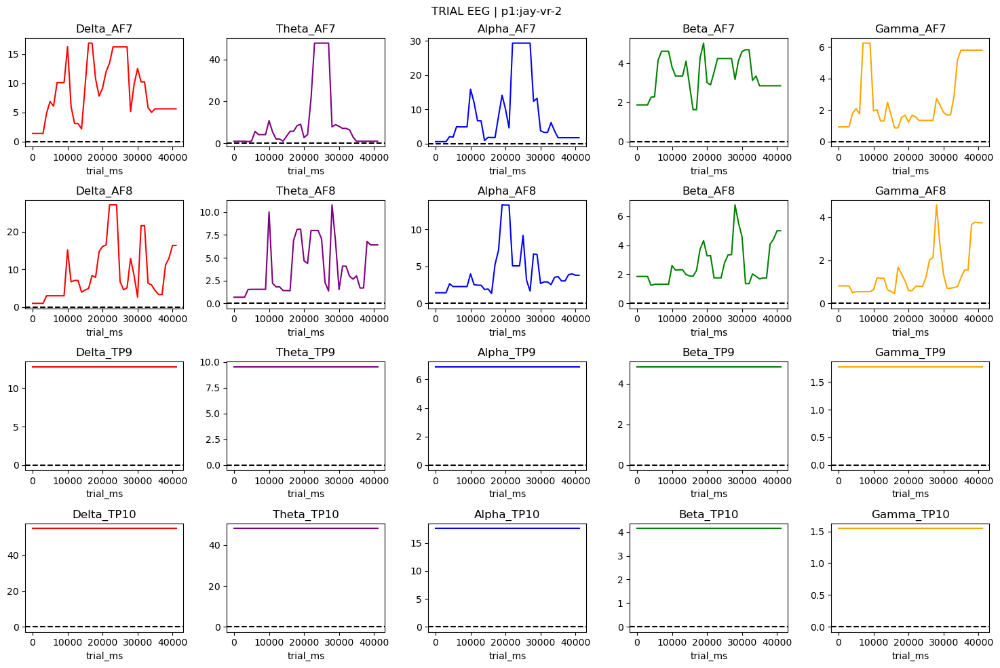

**jay-vr-1**

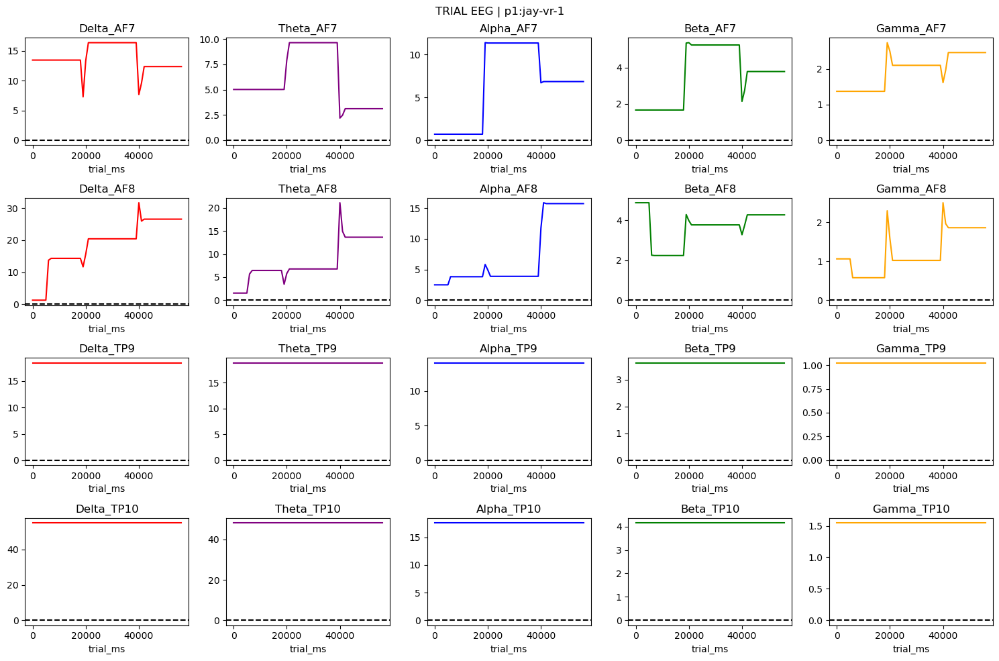

---

### p10

**jay-vr-2**

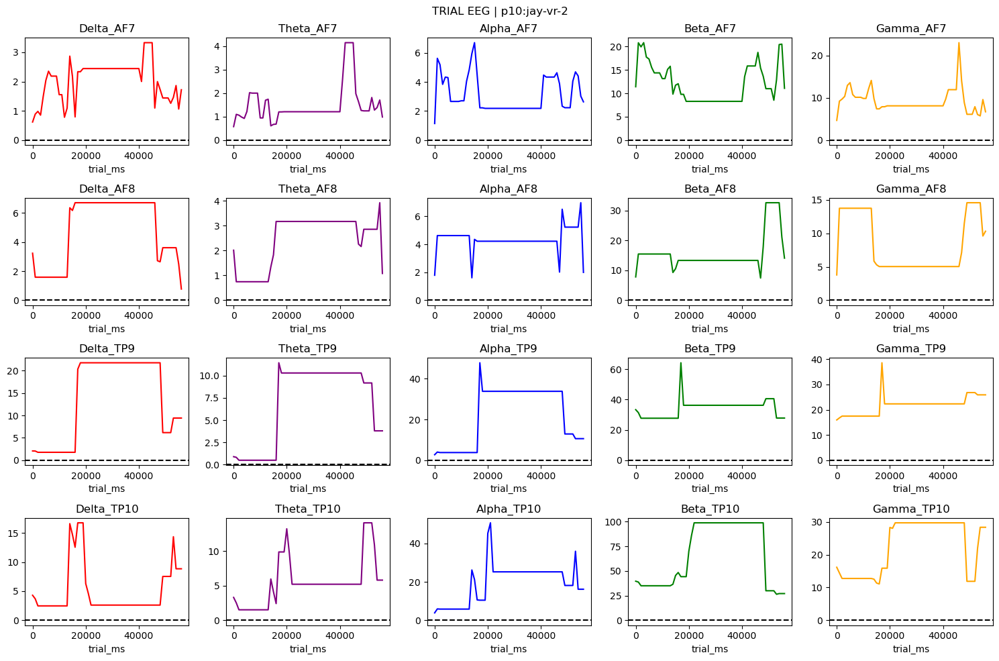

**jay-vr-3**

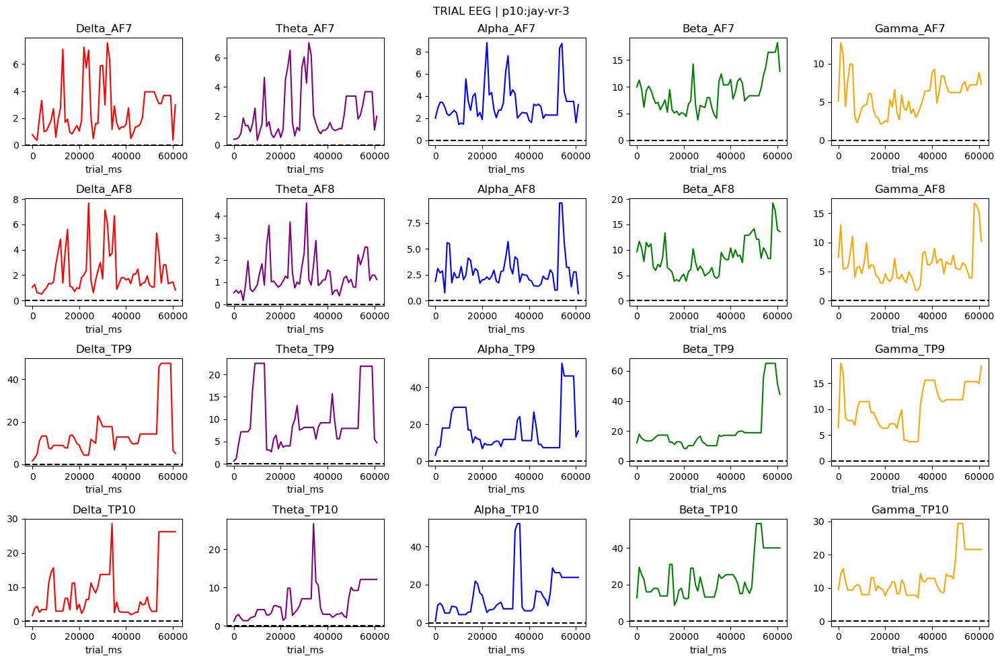

**jay-vr-1**

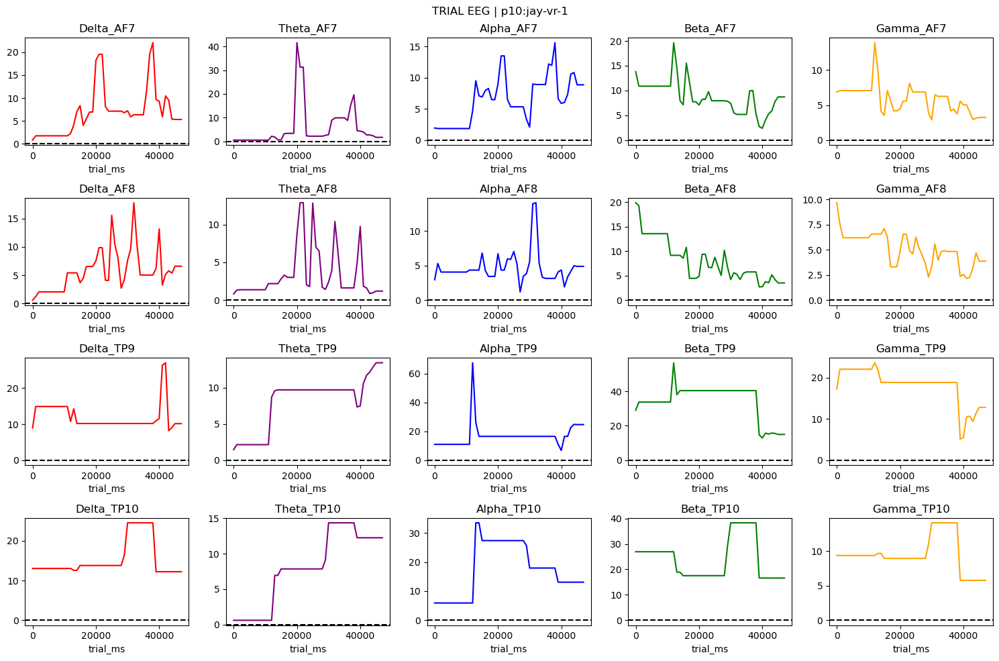

---

### p11

**jay-vr-2**

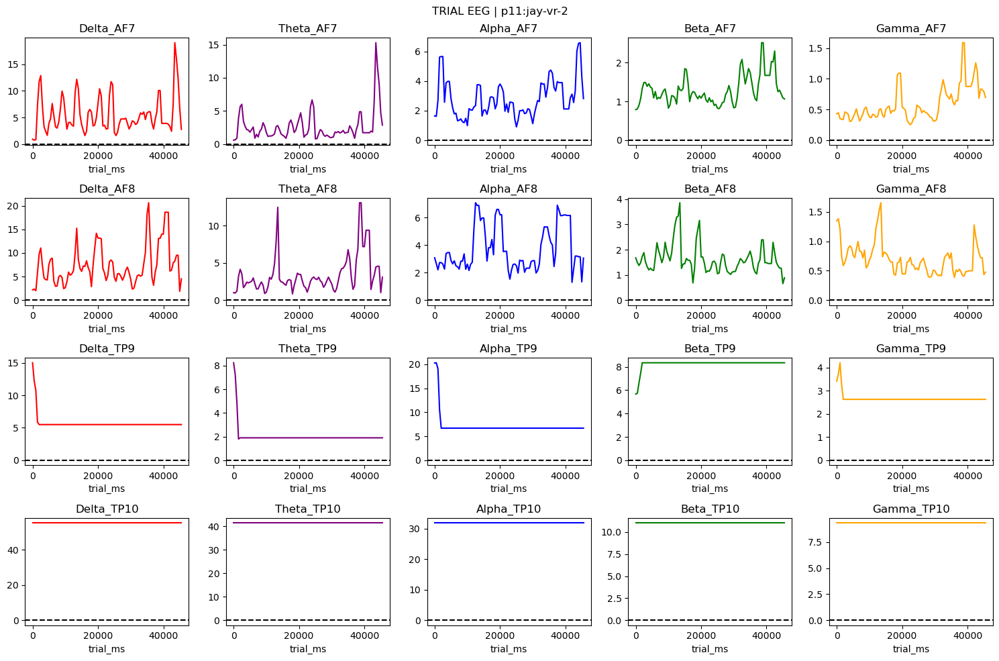

**jay-vr-3**

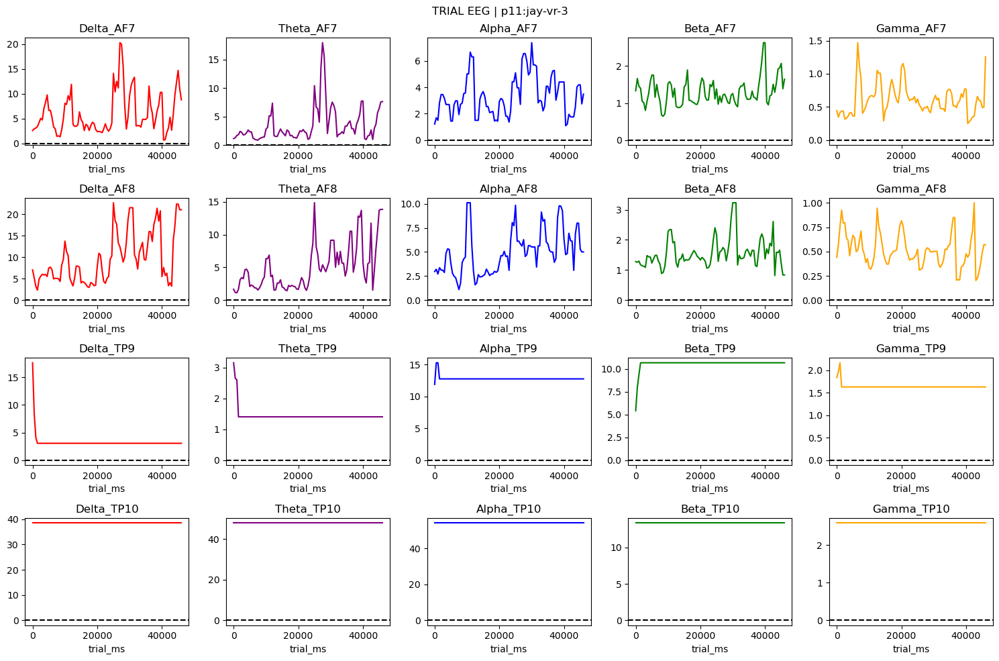

**jay-vr-1**

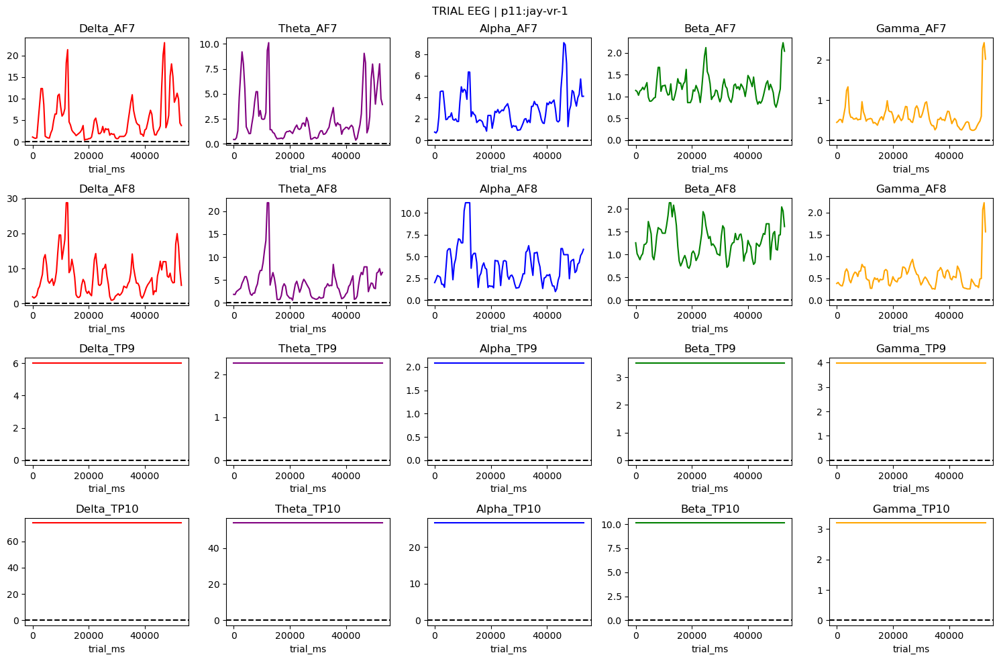

---

### p12

**jay-vr-2**

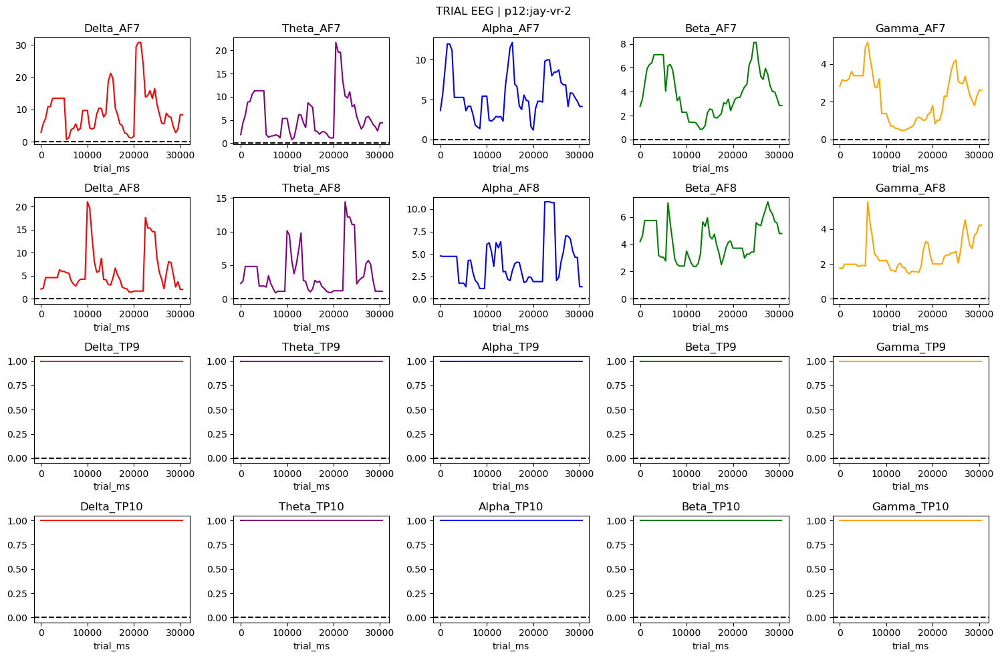

**jay-vr-3**

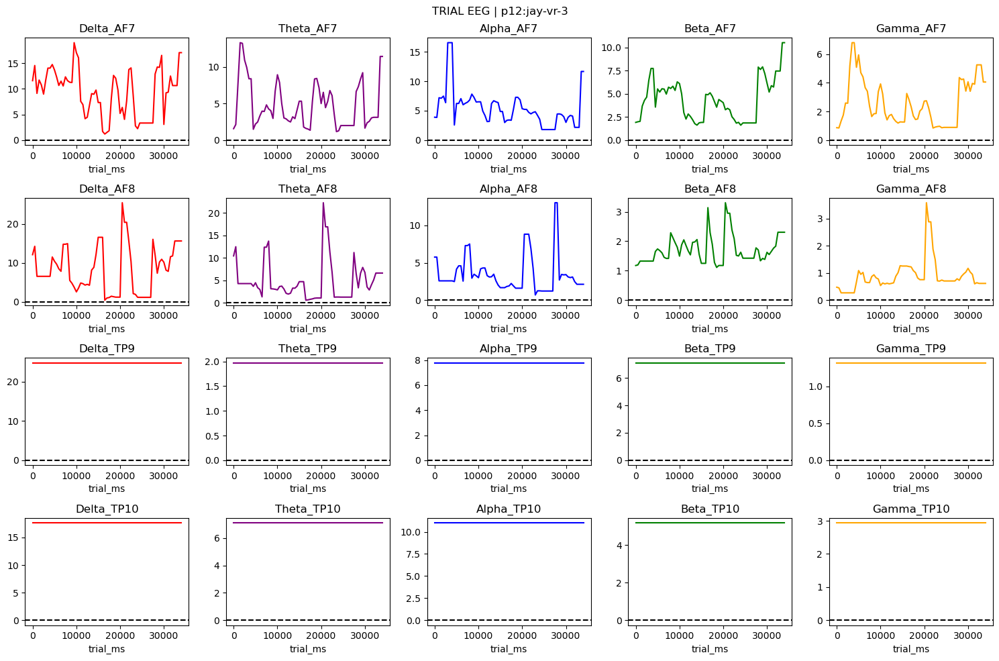

**jay-vr-1**

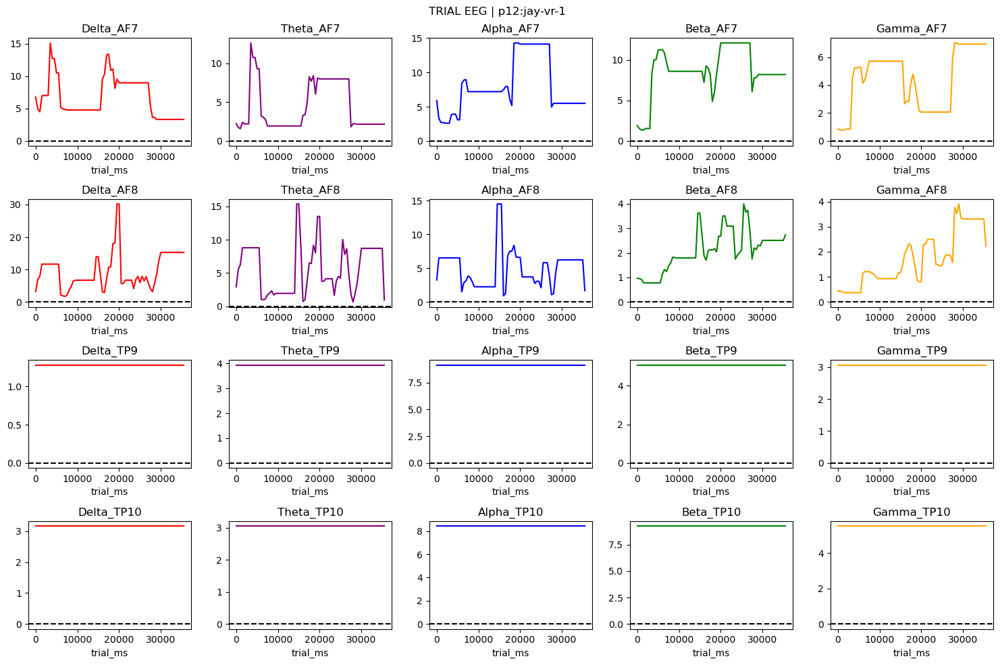

---

### p13

**jay-vr-2**

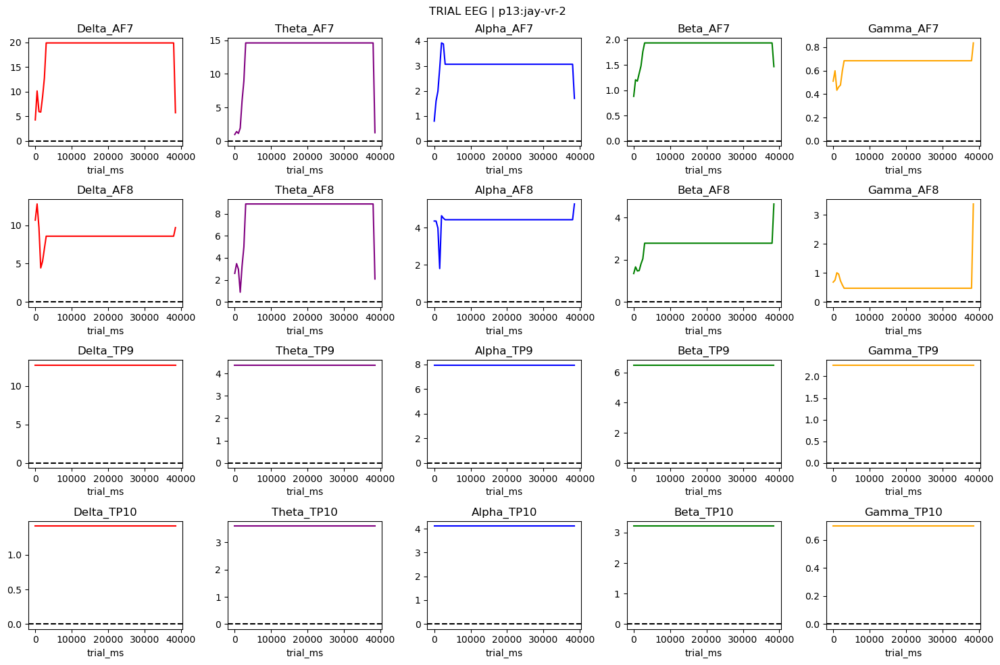

**jay-vr-3**

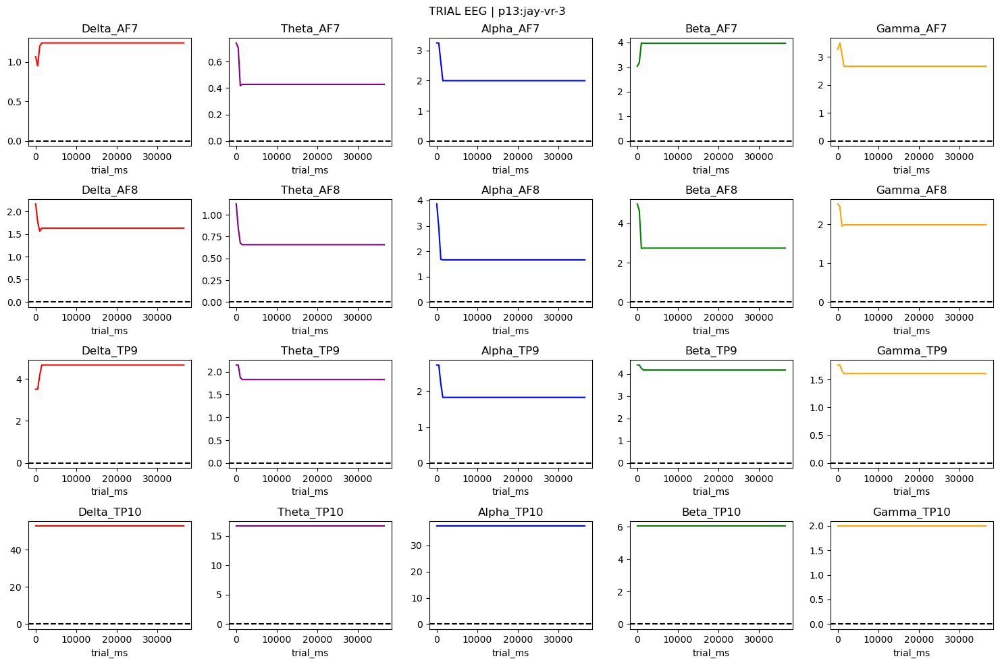

**jay-vr-1**

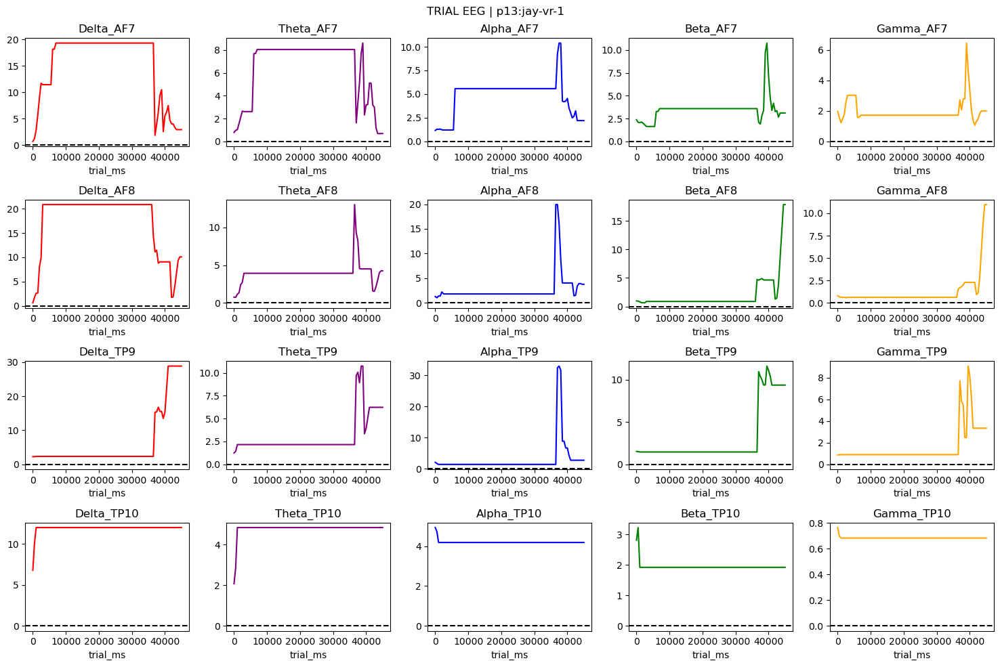

---

### p14

**jay-vr-2**

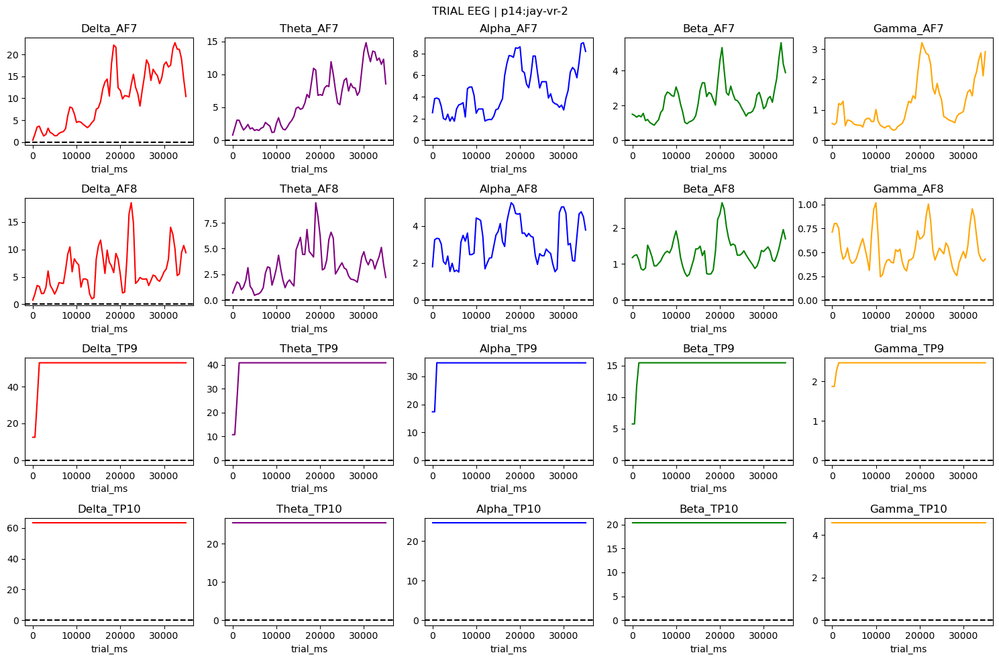

**jay-vr-3**

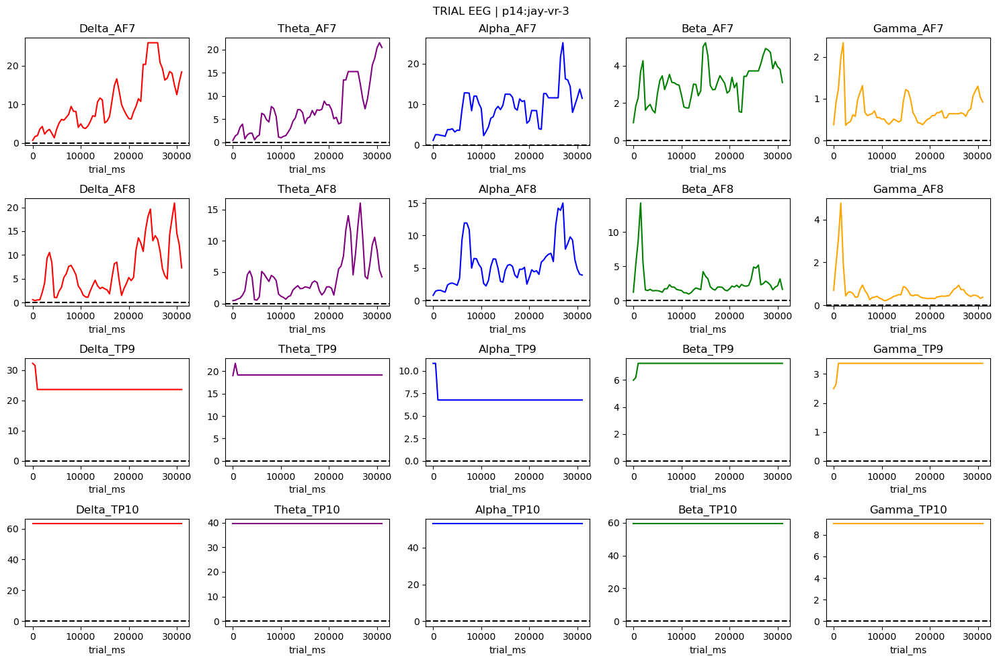

**jay-vr-1**

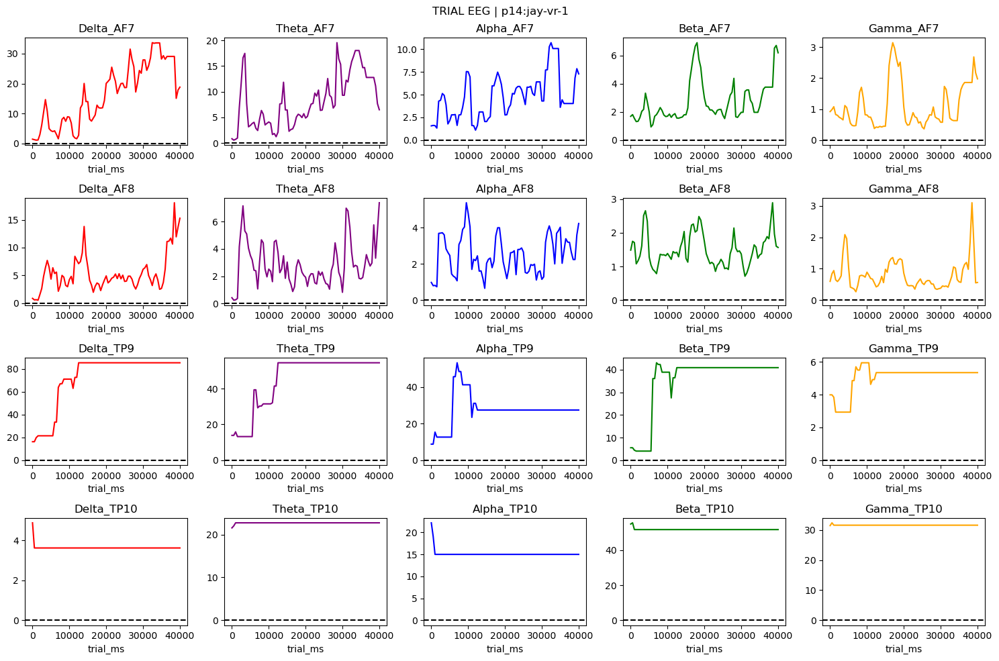

---

### p15

**jay-vr-5**

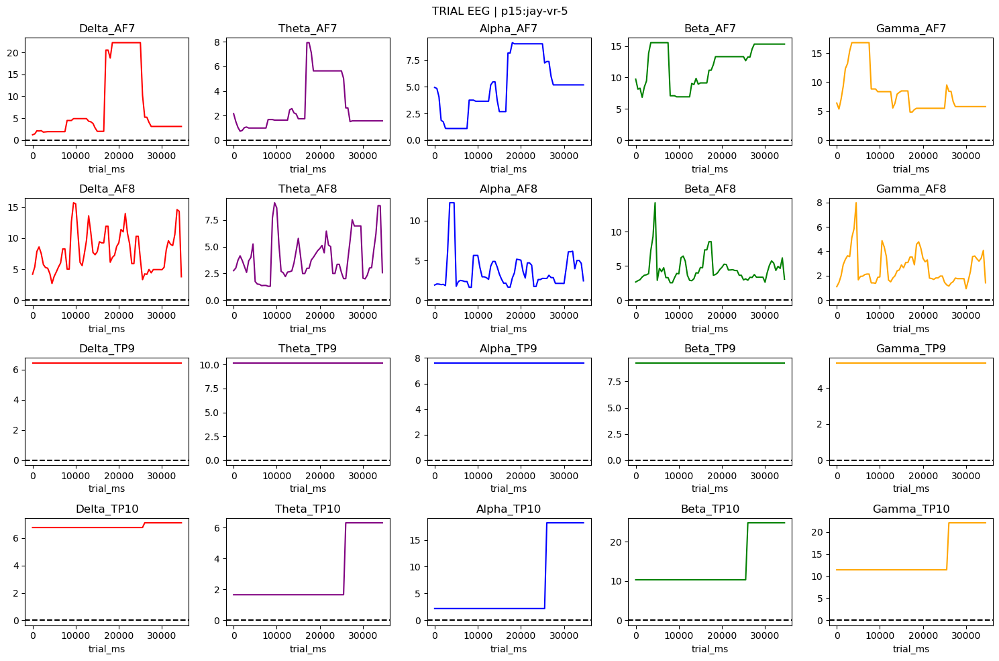

**jay-vr-2**

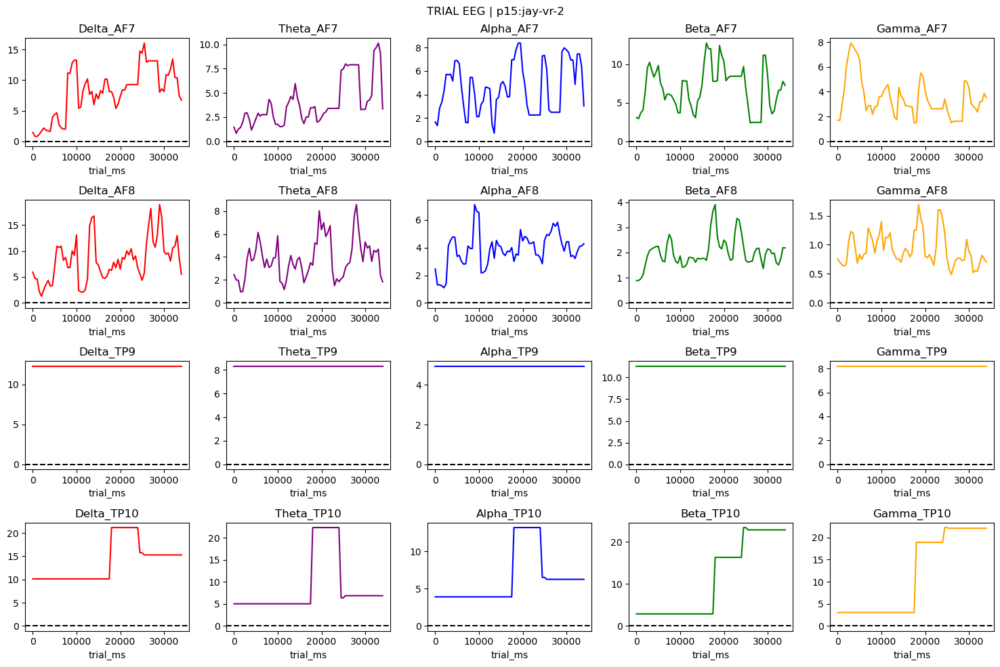

**jay-vr-3**

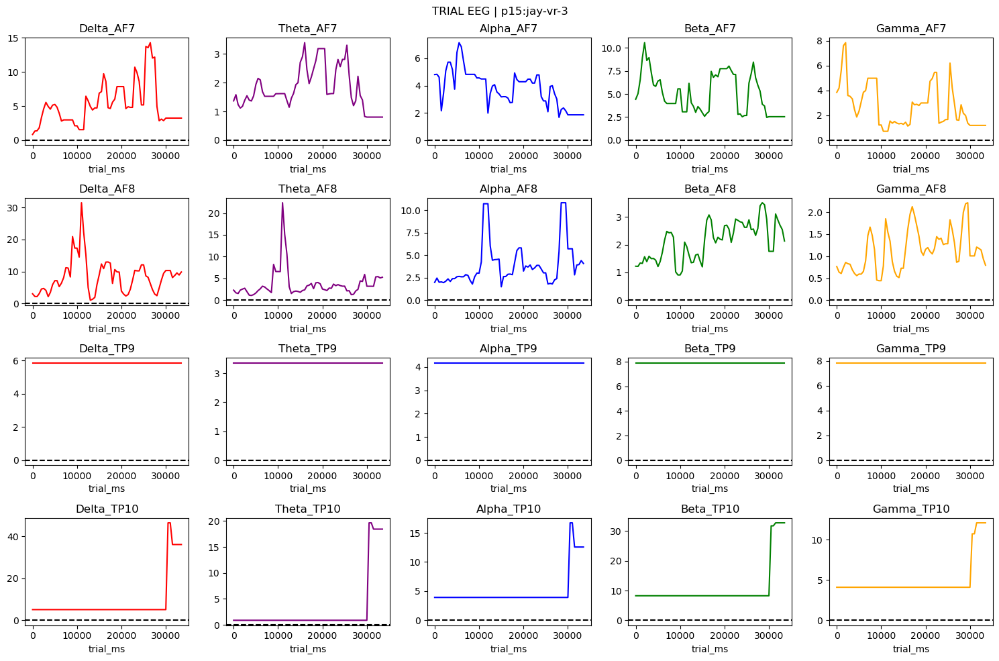

**jay-vr-4**

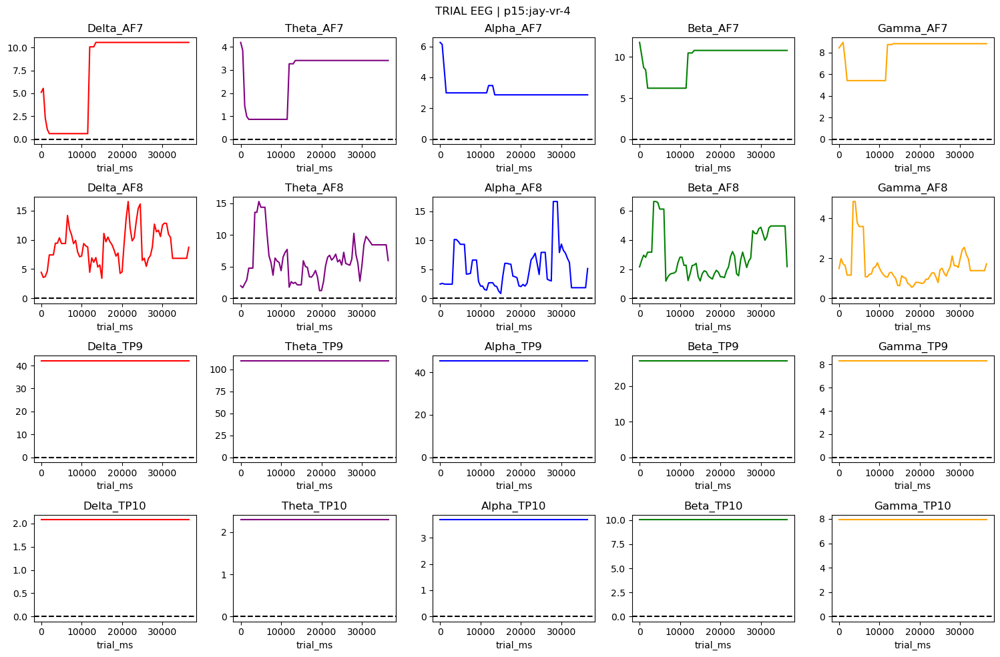

**jay-vr-1**

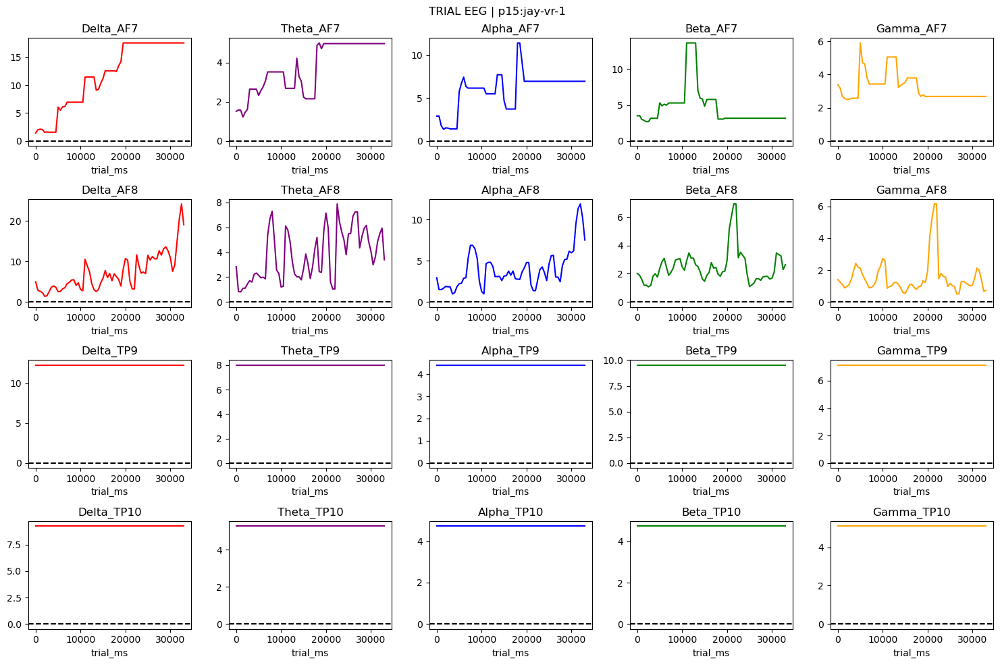

---

### p16

**jay-vr-2**

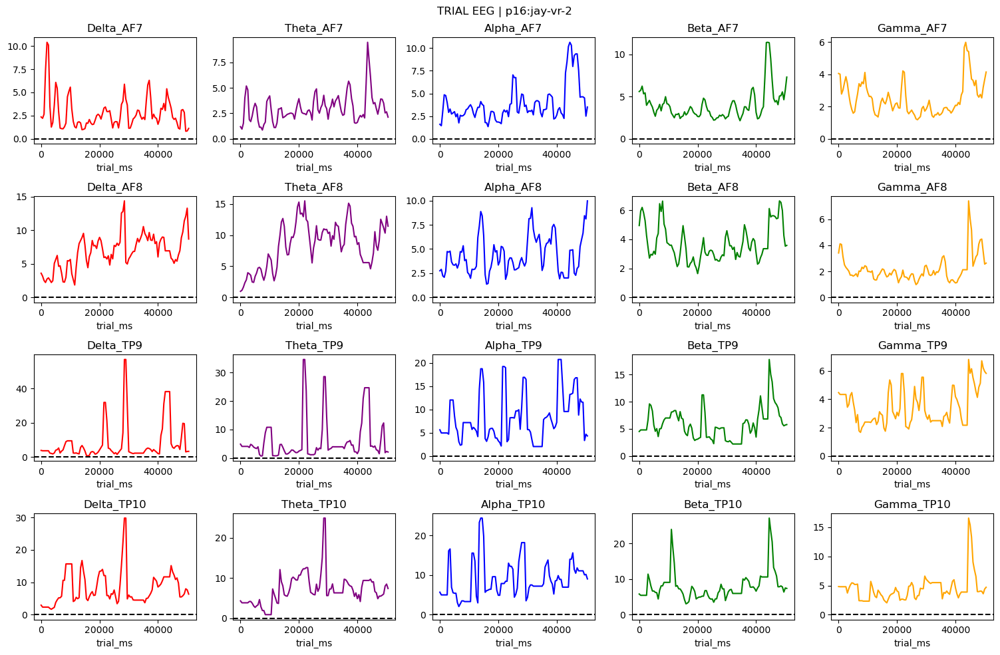

**jay-vr-3**

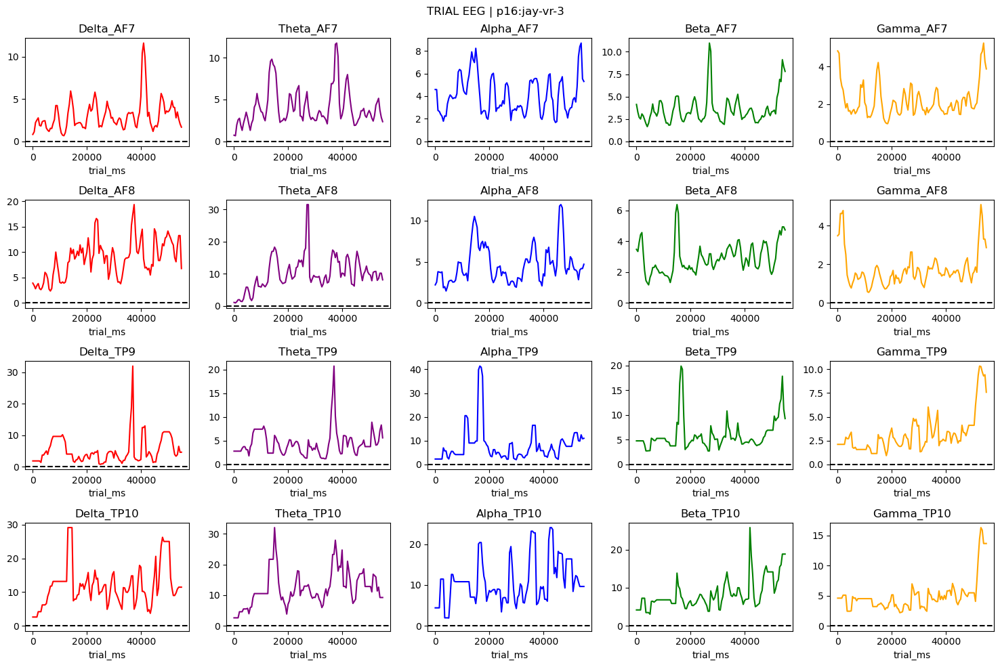

**jay-vr-4**

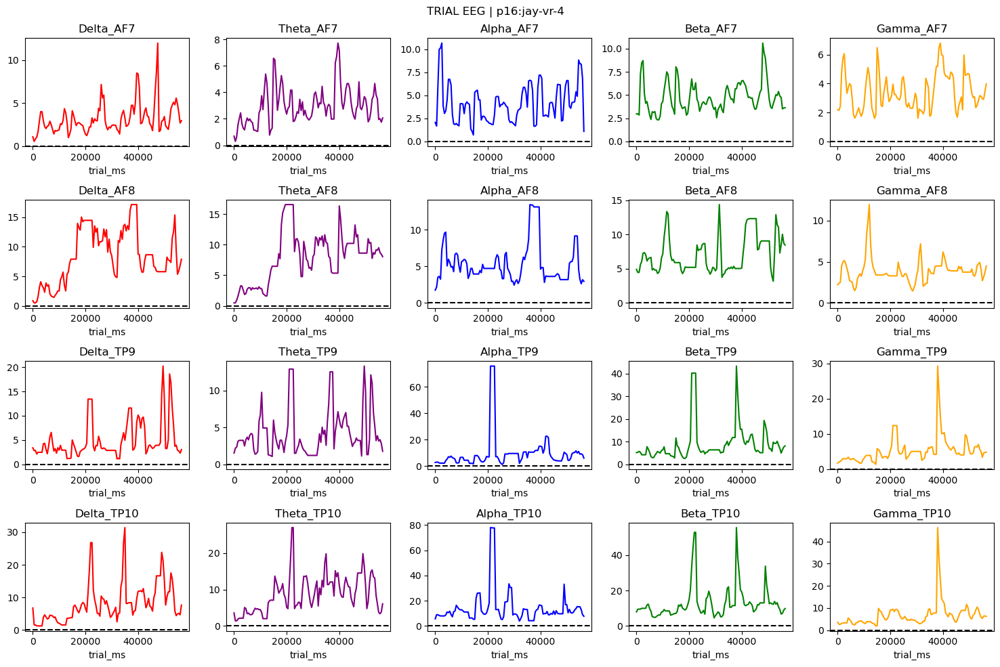

**jay-vr-1**

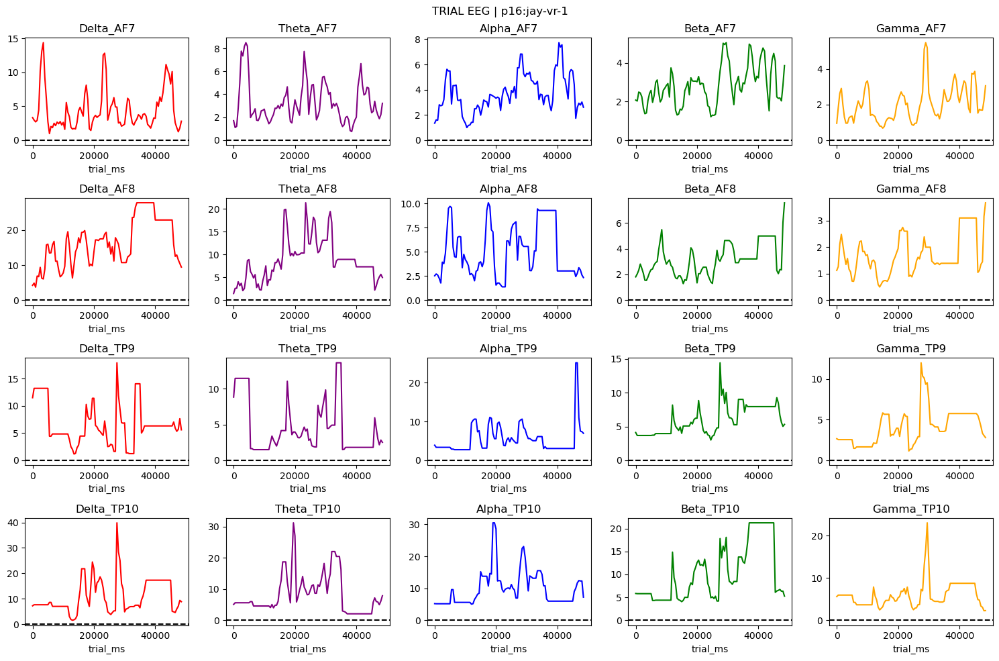

---

### p17

**jay-vr-2**

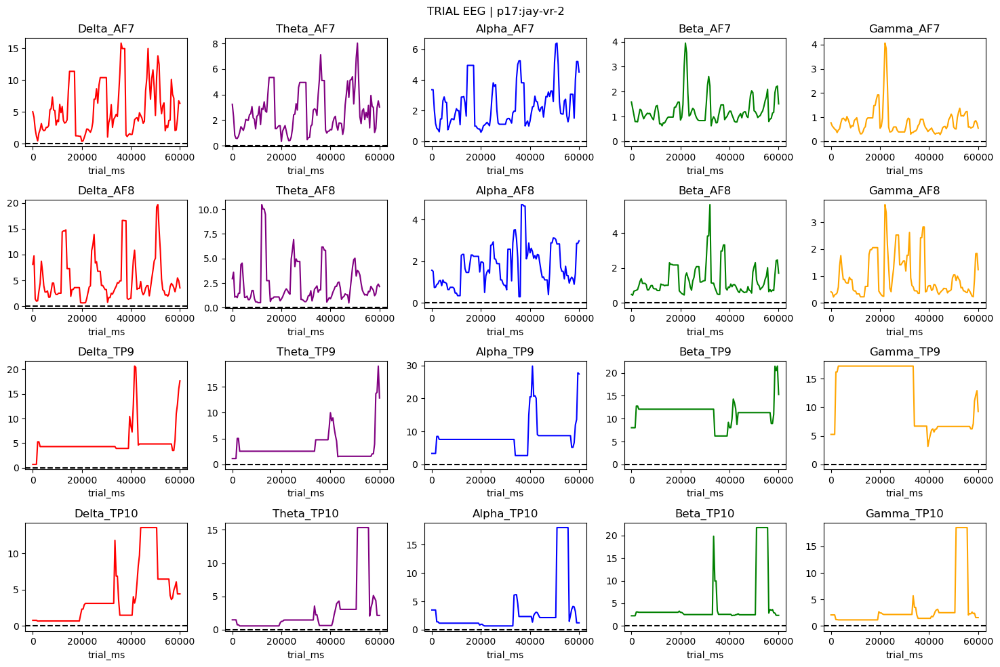

**jay-vr-3**

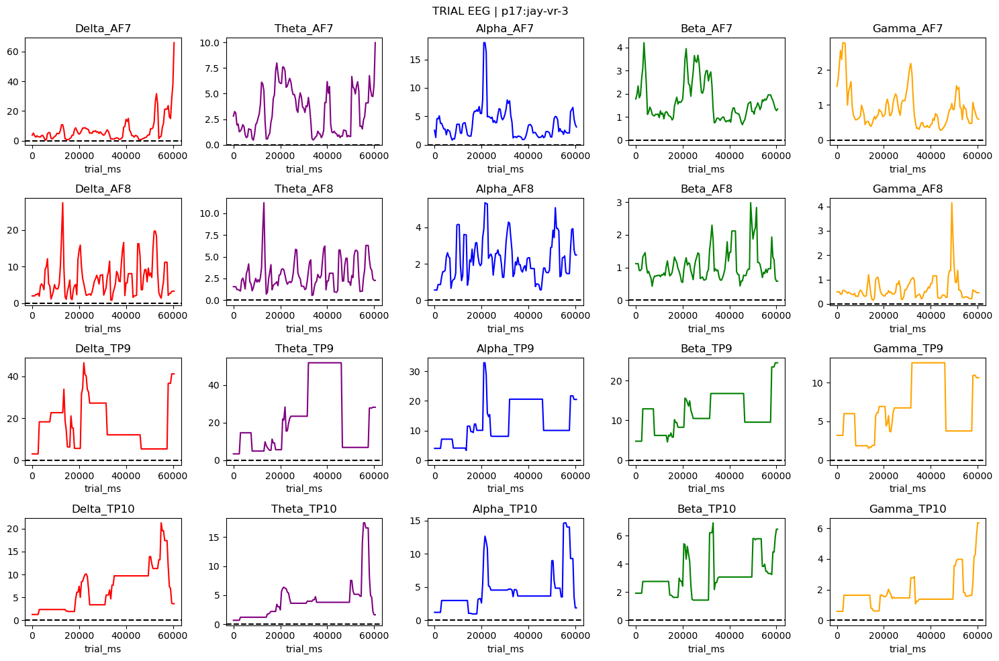

**jay-vr-1**

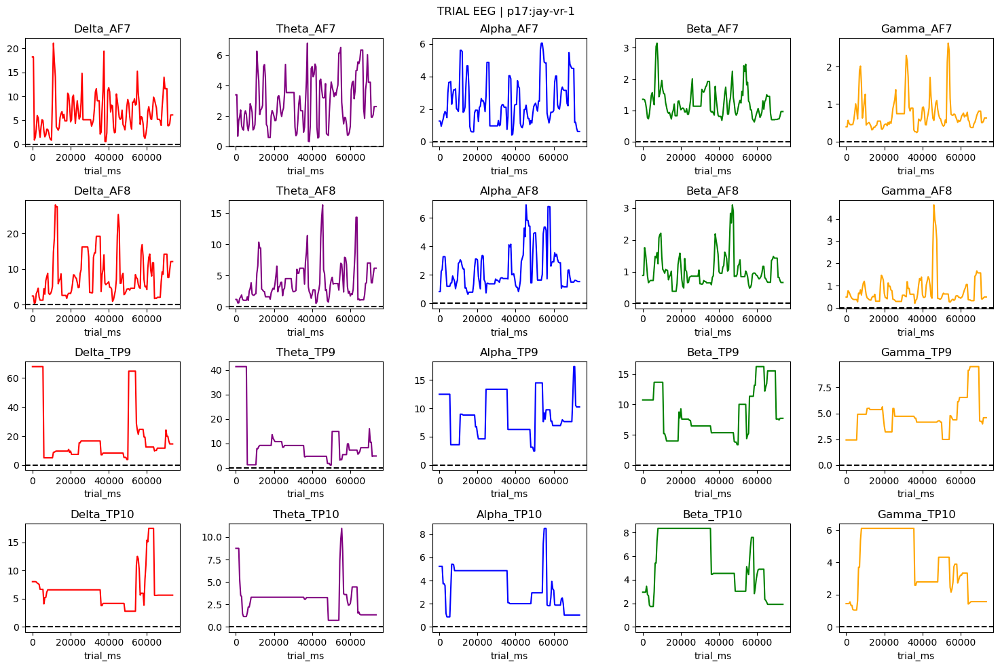

---

### p18

**jay-vr-2**

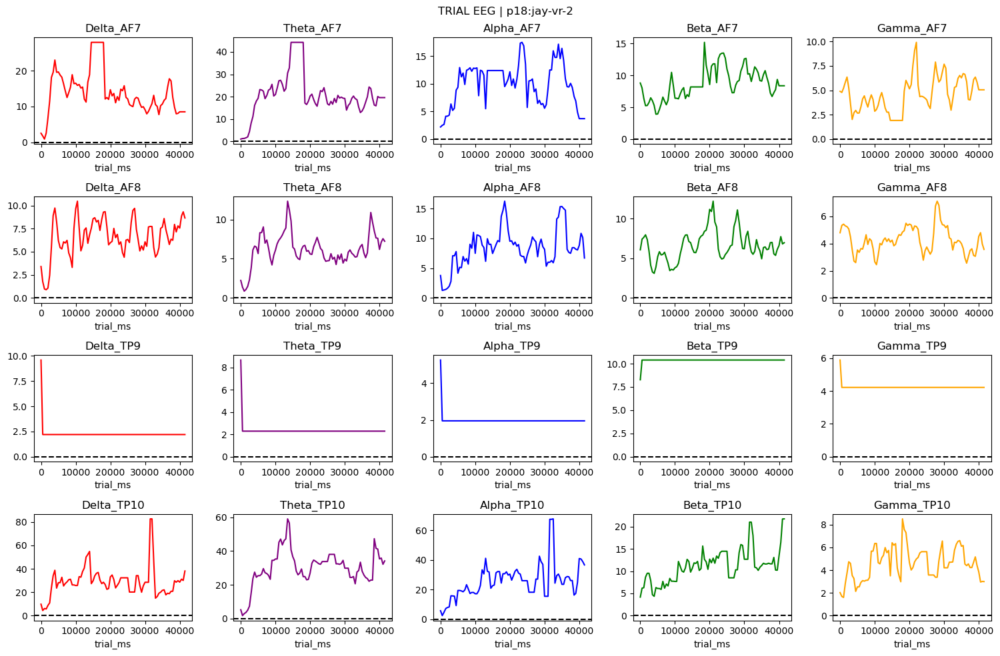

**jay-vr-3**

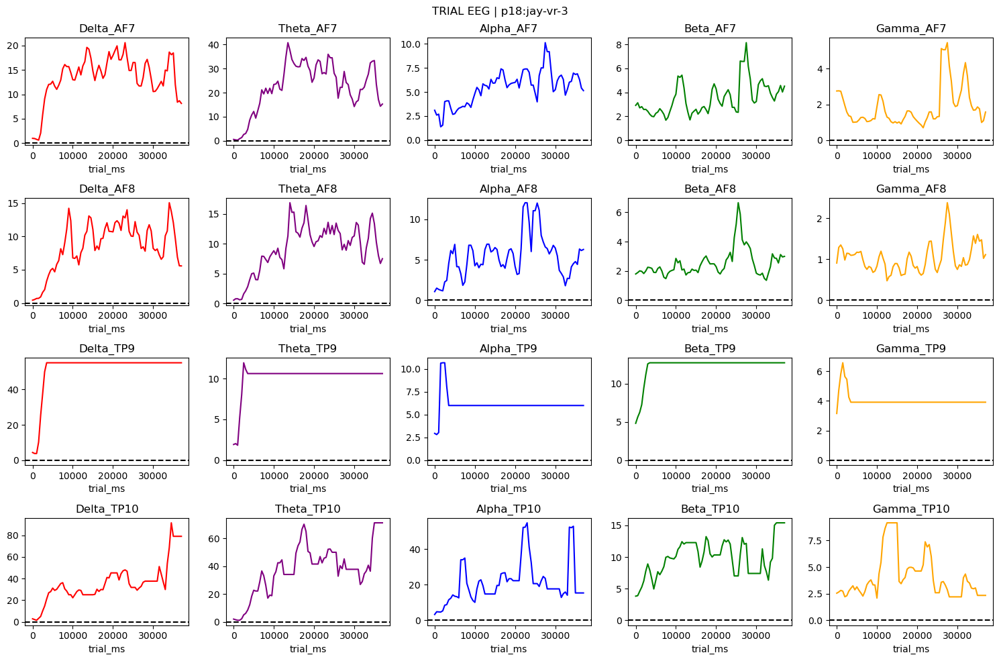

**jay-vr-1**

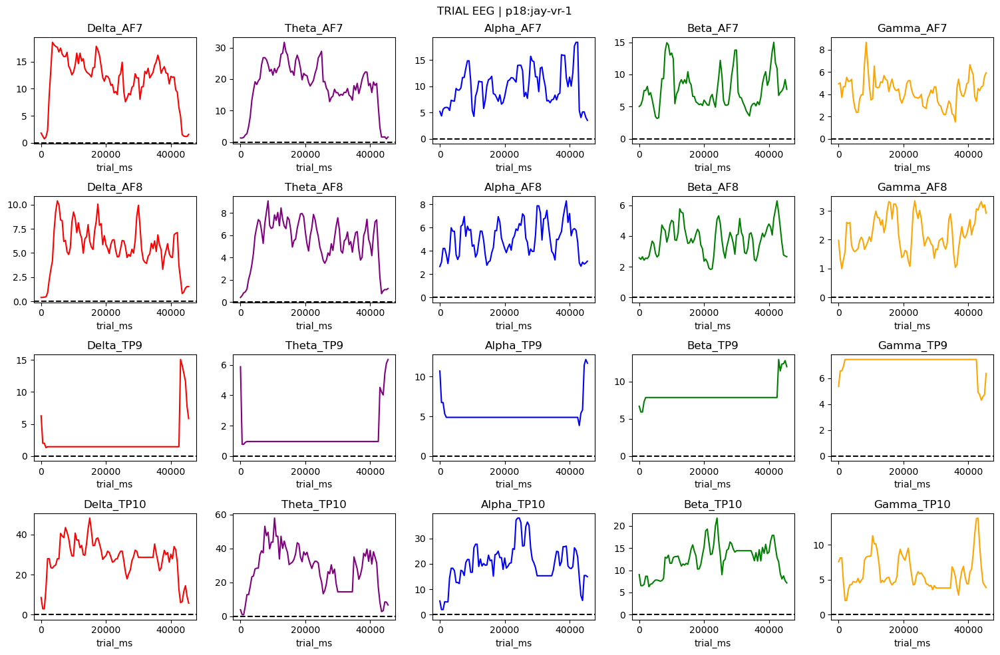

---

### p2

**jay-vr-4**

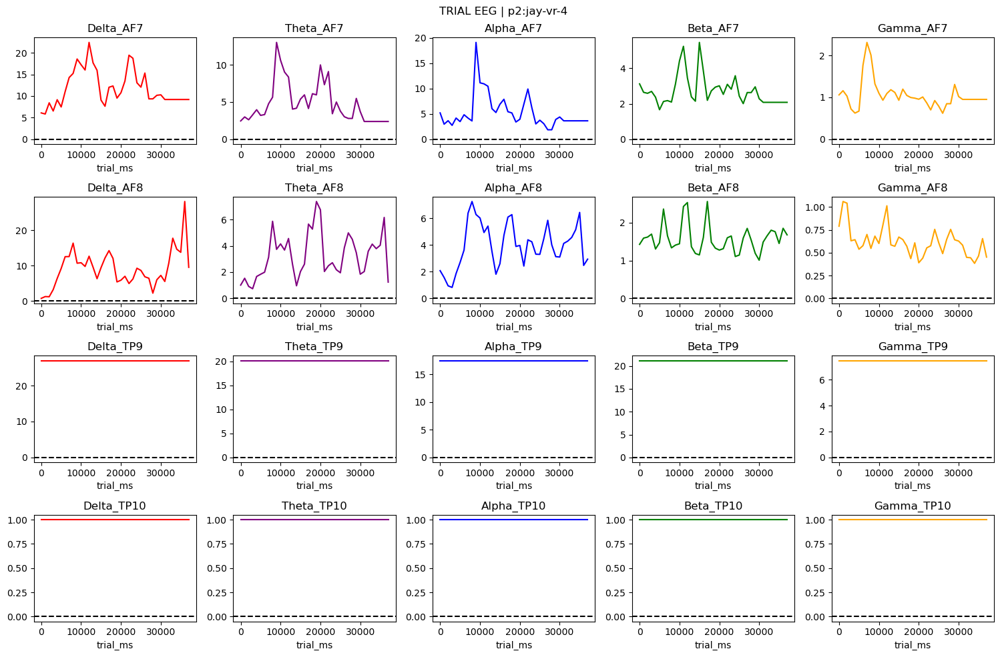

**jay-vr-1**

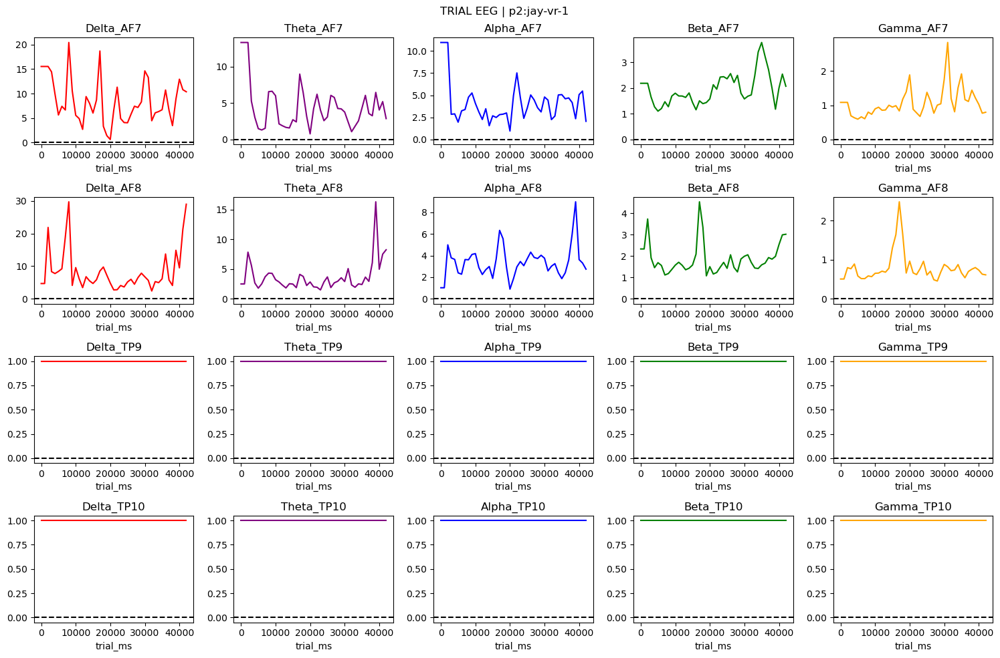

---

### p3

**jay-vr-2**

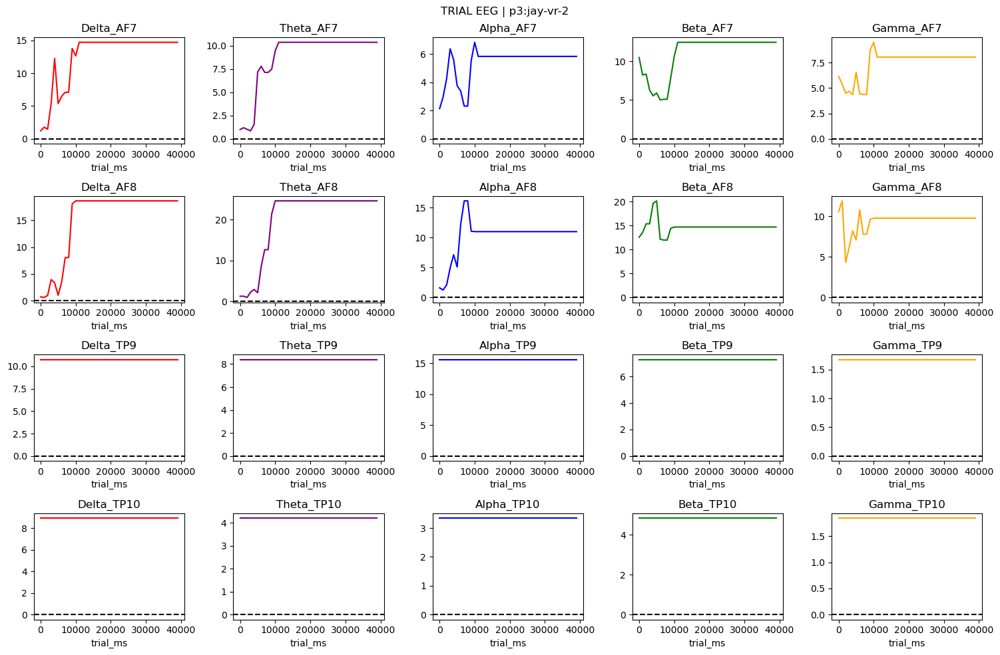

**jay-vr-3**

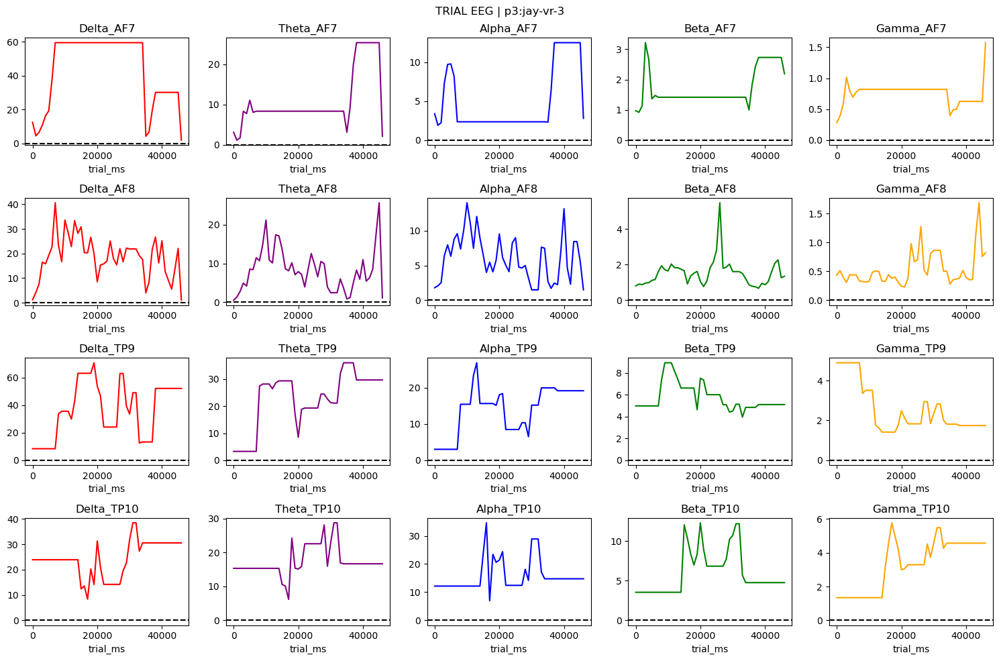

**jay-vr-1**

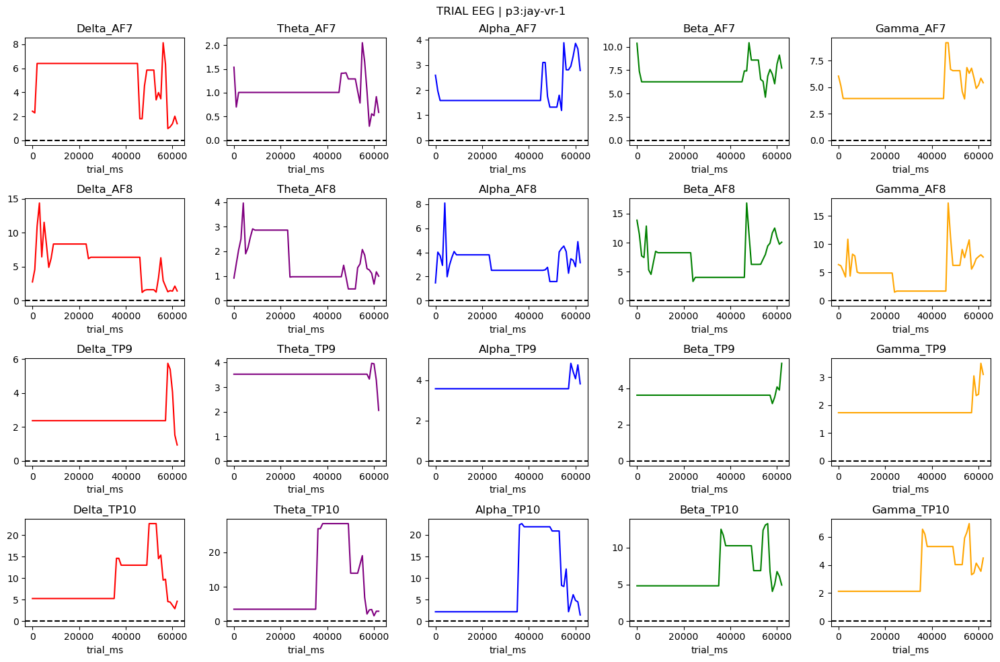

---

### p4

**jay-vr-5**

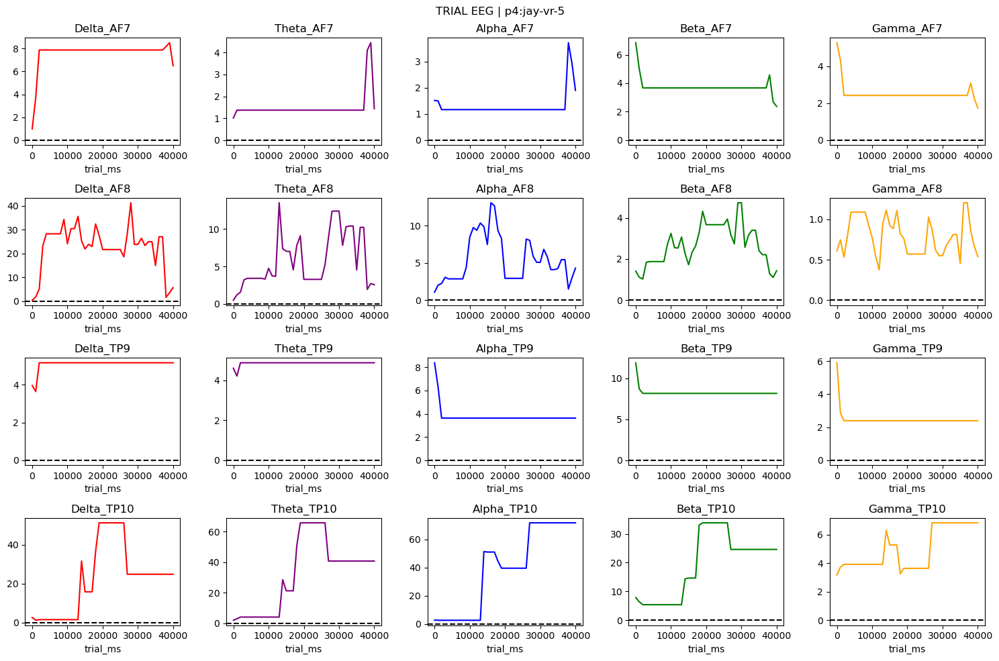

**jay-vr-4**

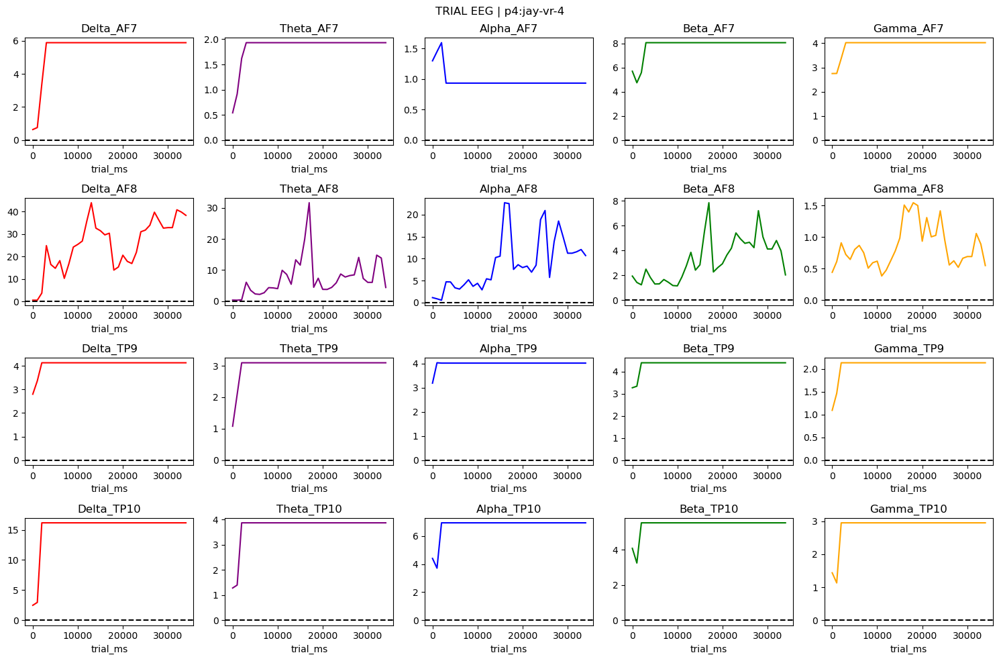

---

### p5

**jay-vr-2**

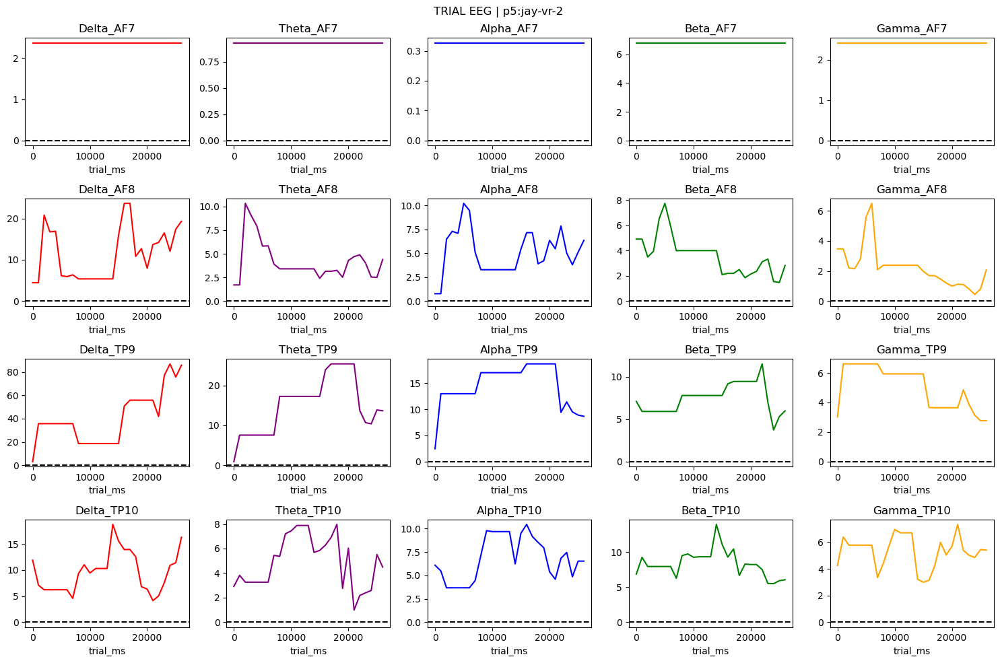

**jay-vr-1**

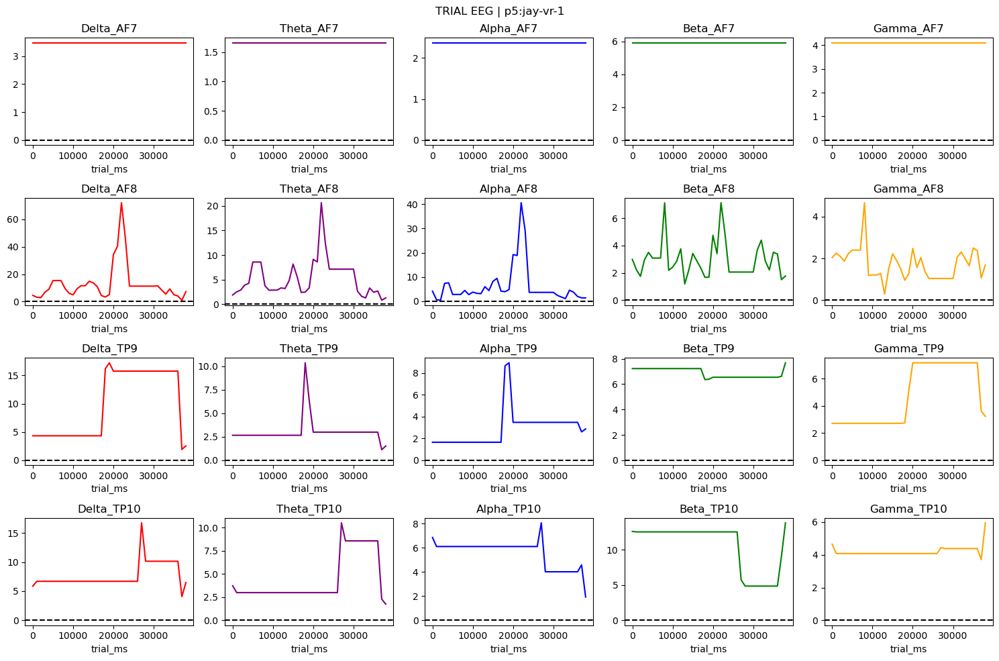

---

### p6

**jay-vr-2**

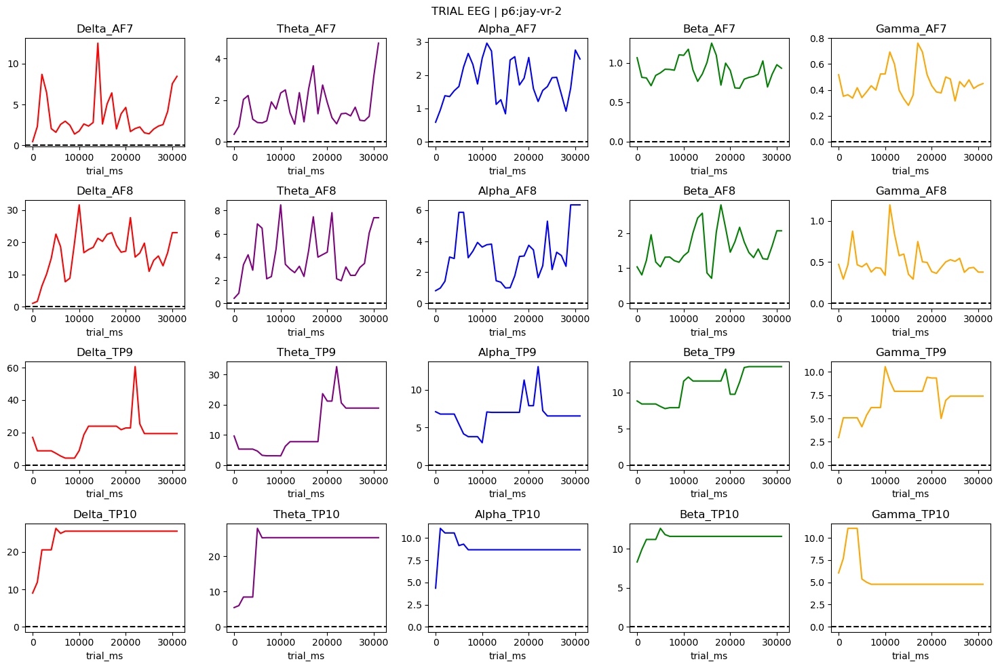

**jay-vr-1**

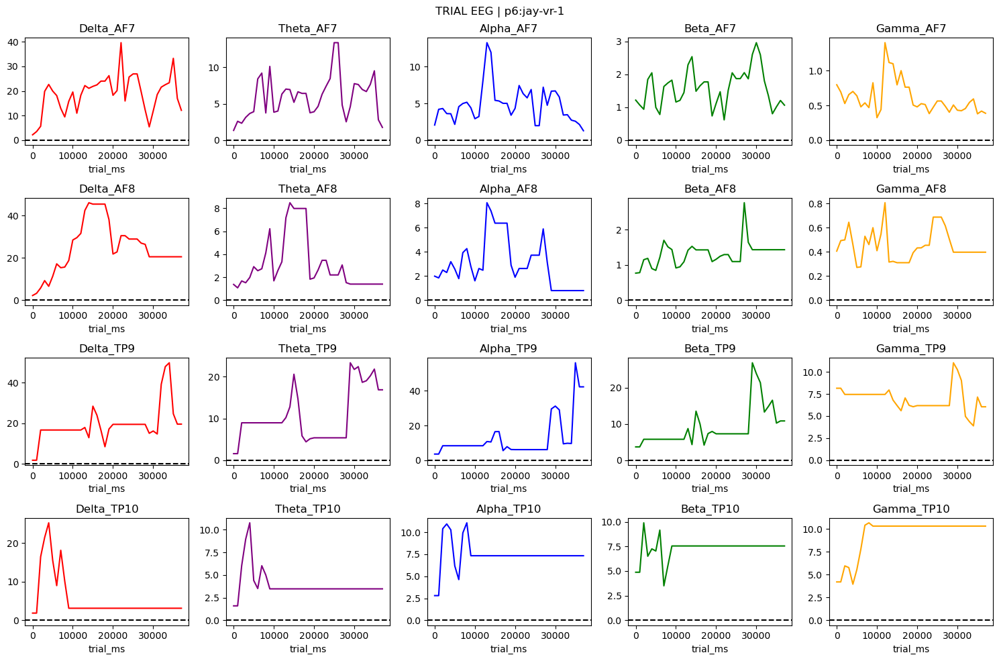

---

### p7

**jay-vr-2**

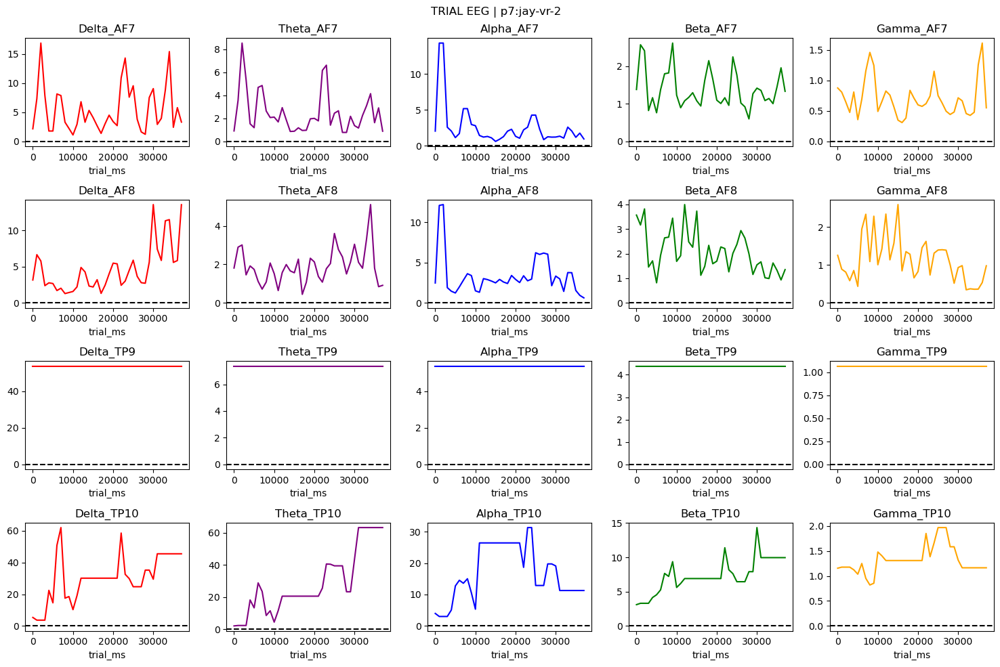

**jay-vr-1**

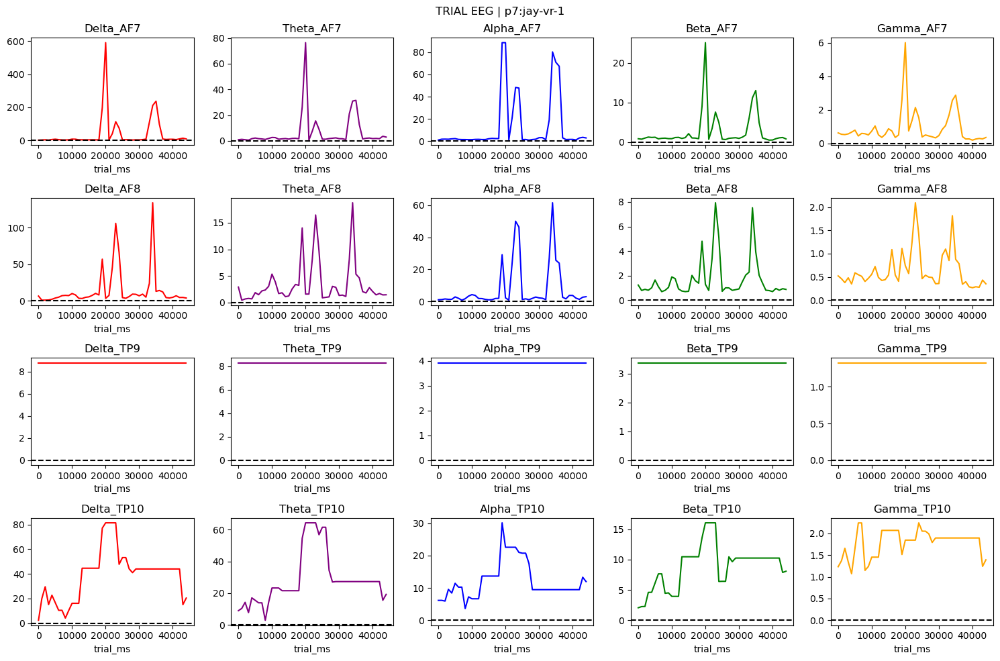

---

### p8

**jay-vr-2**

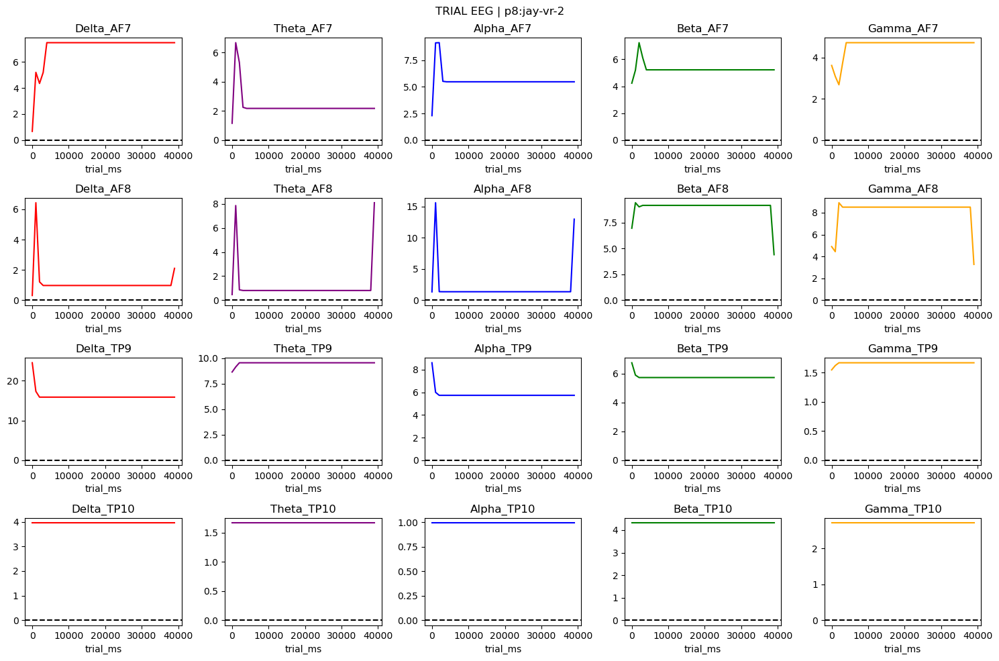

**jay-vr-3**

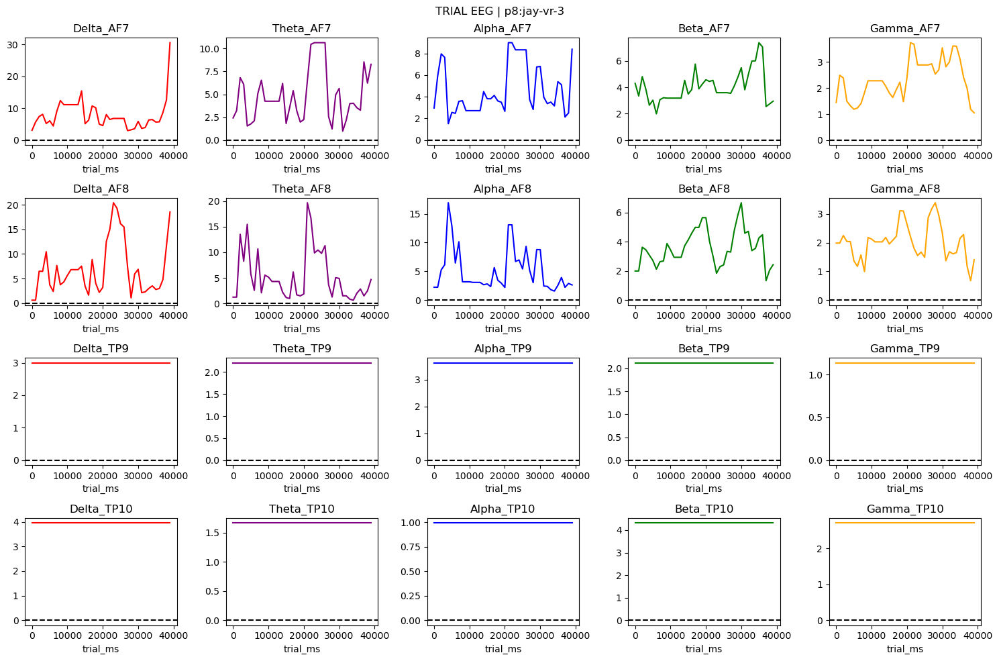

**jay-vr-1**

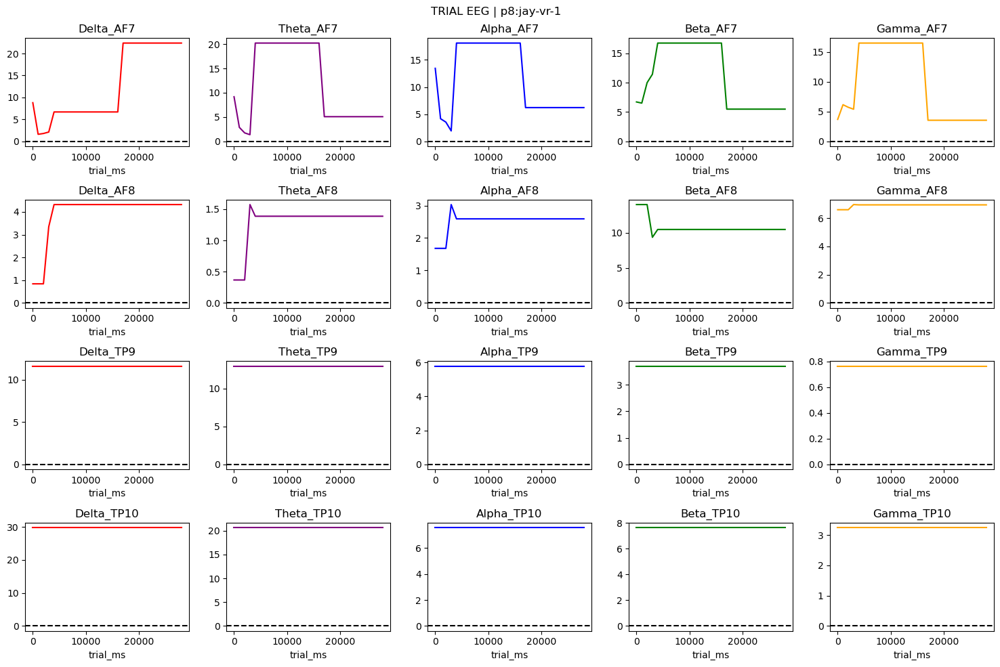

---

### p9

**jay-vr-2**

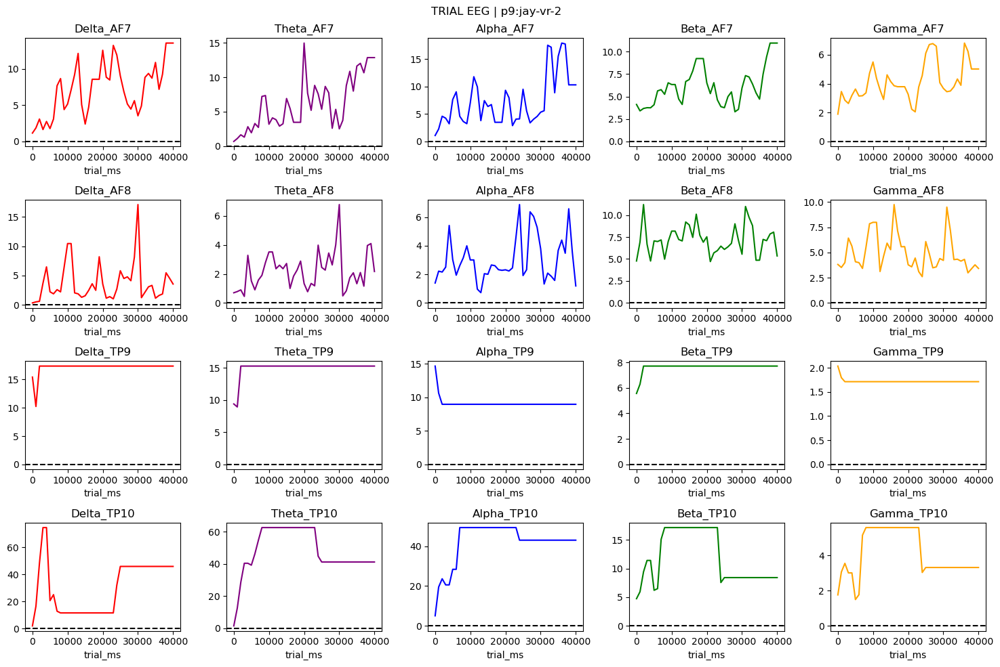

**jay-vr-1**

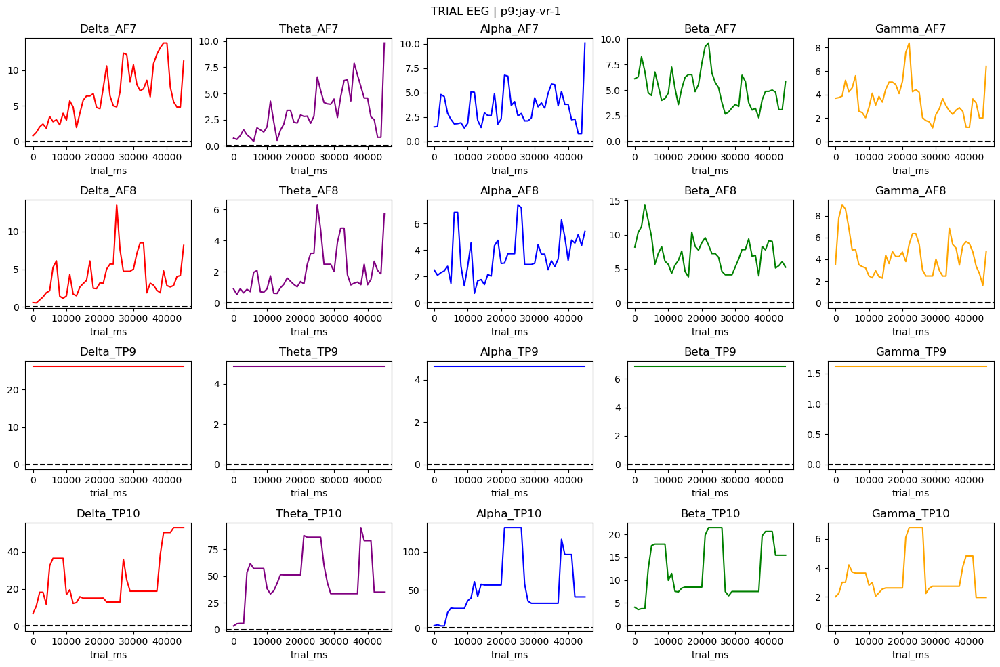

---

In [7]:
for pid in trial_files:
    IDisplay(Markdown(f'### {pid}'))
    for tid in trial_files[pid]:
        # Similarly to our previous loop, determine the URL to this trial directory
        trial_dir = os.path.join(_ALIGNED_DIR, pid, tid)
        IDisplay(Markdown(f'**{tid}**'))

        fig, ax = plt.subplots(nrows=4, ncols=5)
        fig.set_figheight(10)
        fig.set_figwidth(15)
        fig.suptitle(f"TRIAL EEG | {pid}:{tid}")
        participant_trial_eegs = all_trial_eegs[(all_trial_eegs['participant'] == pid) & (all_trial_eegs['trial'] == tid)]

        for i in range(len(_FREQUENCY_BANDS)):
            freq = _FREQUENCY_BANDS[i]
            color = _FREQUENCY_COLORS[i]
            for j in range(len(_ELECTRODE_CHANNELS)):
                electrode = _ELECTRODE_CHANNELS[j]
                colname = f"{freq}_{electrode}"
                this_trial_ax = participant_trial_eegs.plot.line(x='trial_ms',y=colname, ax=ax[j,i], color=color, title=colname)
                this_trial_ax.legend_ = None
                this_trial_ax.axhline(y=0, color='black', linestyle='--')

        plt.tight_layout()
        plt_savename = os.path.join(_OUTPUT_DIR, f'{pid}-{tid}_eeg.png')
        plt.savefig(plt_savename, bbox_inches="tight", pad_inches=0.1,)
        plt.show()
    IDisplay(Markdown('---'))

### Filter List

_Look specifically for AF7 and AF8 combos that don't feature too much flatlining. Bolded = Usable._

* __P1:__ 2 trials, 1 usable
    * ~~1~~
    * __2 (AF7, AF8)__
* __P2:__ 2 trials, 2 usable (4 total, 3 usable)
    * __1 (AF7, AF8)__
    * __4 (AF7, AF8)__
* __P3:__ 3 trials, 0 usable (7 total, 3 usable)
    * ~~1~~
    * ~~2~~
    * 3 (AF8)
* __P4:__ 2 trials, 0 usable (9 total, 3 usable)
    * 4 (AF8)
    * 5 (AF8)
* __P5:__ 2 trials, 0 usable (11 total, 3 usable)
    * 1 (AF8), 
    * 2 (AF8, TP10)
* __P6:__ 2 trials, 2 usable (13 total, 5 usable)
    * __1 (AF7, AF8)__
    * __2 (AF7, AF8)__
* __P7:__ 2 trials, 2 usable (15 total, 7 usable)
    * __1 (AF7, AF8)__
    * __2 (AF7, AF8)__
* __P8:__ 3 trials, 1 usable (18 total, 8 usable)
    * ~~1~~
    * ~~2~~
    * __3 (All)__
* __P9:__ 2 trials, 2 usable (20 total, 10 usable)
    * __1 (AF7, AF8)__
    * __2 (AF7, AF8)__
* __P10:__ 3 trials, 1 usable (23 total, 11 usable)
    * ~~1~~
    * ~~2~~
    * __3 (All)__
* __P11:__ 3 trials, 3 usable (26 total, 14 usable)
    * __1 (AF7, AF8)__
    * __2 (AF7, AF8)__
    * __3 (AF7, AF8)__
* __P12:__ 3 trials, 2 usable (29 total, 16 usable)
    * ~~1~~
    * __2 (AF7, AF8)__
    * __3 (AF7, AF8)__
* __P13:__ 3 trials, 0 usable (32 total, 16 usable)
    * ~~1~~
    * ~~2~~
    * ~~3~~
* __P14:__ 3 trials, 3 usable (35 total, 19 usable)
    * __1 (AF7, AF8)__
    * __2 (AF7, AF8)__
    * __3 (AF7, AF8)__
* __P15:__ 5 trials, 2 usable (40 total, 21 usable)
    * 1 (AF8)
    * __2 (AF7, AF8)__
    * __3 (AF7, AF8)__
    * 4 (AF8)
    * 5 (AF8)
* __P16:__ 4 trials, 4 usable (44 total, 25 usable)
    * __1 (All)__
    * __2 (All)__
    * __3 (All)__
    * __4 (All)__
* __P17:__ 3 trials, 3 usable (47 total, 28 usable)
    * __1 (AF7, AF8)__
    * __2 (AF7, AF8)__
    * __3 (AF7, AF8)__
* __P18:__ 3 trials, 3 usable (50 total, 31 usable)
    * __1 (AF7, AF8, TP10)__
    * __2 (AF7, AF8, TP10)__
    * __3 (AF7, AF8, TP10)__